# Week 2 - Counting Words & Phrases (Computational Linguistics)
This week, we take text corpora that we have developed, spidered, scraped, and encoded, and we find and count words, simple and parsed phrases and explore the statistical properties of those counts (e.g., word frequency distributions). Initially, we model how to search corpora for keywords or phrases. Next, we examine the distributions of terms and phrases across a corpus, and the correlation between different words and phrase counts. In order to do this effectively, we coarsely disambiguate words based of part-of-speech (POS) tagging, and normalize them through stemming and lemmatization. Next we distinguish *important* words and phrase within the corpus, and image them with Wordls! Then we calculate word frequenceis, conditional frequences (the frequency of word *shock* conditional on the presence of word *awe*), and statistically significant collocations of lengths 2 through $n$. Finally, we calculate and visualize Differences (Divergences and Distances) between the word frequency distributions from two corpora.

Then we shift to focus not simply on the *ideas* in a corpus, but also extracting precise *claims*. This process involves a sequential pipeline of classifying and structuring tokens from text, each of which generates potentially useful data for the content analyst. Steps in this process, which we examine in this notebook, include: 1) tagging words by their part of speech (POS) to reveal the linguistic role they play in the sentence (e.g., Verb, Noun, Adjective, etc.); 2) tagging words as named entities (NER) such as places or organizations; 3) structuring or "parsing" sentences into nested phrases that are local to, describe or depend on one another; and 4) extracting informational claims from those phrases.

We will be introducing spaCy as a package for Computational Linguistics, and also walk you through how to use the Davies Corpora.

While we wish to avoid using NLTK for heavy corpus analysis, some of its smaller functions can still be useful.

Of course, for final projects that draw on these tools, we encourage you to install the software on your own machines or shared servers at the university (RCC, SSRC) in order to perform these operations on much more text.

For this notebook we will be using the following packages:


In [230]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
# !pip install git+https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

import lucem_illud #just in case, regularly update your lucem_illud with the following code: pip install git+https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

#All these packages need to be installed from pip
import requests #for http requests
import pandas #gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import wordcloud #Makes word clouds
import numpy as np #For divergences/distances
import scipy #For divergences/distances
import seaborn as sns #makes our plots look nicer
import sklearn.manifold #For a manifold plot
import json #For API responses
import urllib.parse #For joining urls

# comp-linguistics
import spacy

#Displays the graphs
import graphviz #You also need to install the command line graphviz

#These are from the standard library
import os.path
import zipfile
import subprocess
import io
import tempfile

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook
%matplotlib inline

In [231]:
import bz2
import os
import csv
import gzip

# Retrieving exemplary corpora

To get started we will need some examples. Let's start by downloading one of the corpuses from the Davies set purchased for this class and developed by a computational linguist at Brigham Young University. We can get a list of works available from the [corpora here](https://www.english-corpora.org/).

In this notebook, I will be accessing the data locally - you also have access to this data through the Dropbox download link (shared on Canvas, not here, because the GitHub is publically accessible). The same code can be modified slighlty to access the rest of the corpora on RCC. There is a notebook describing this process in the same repository, as well as in the same directory on RCC.

In [3]:
corpus_name = 'D:/data/macss/MACS60000/week2/Movies/'
# corpus_name = "Movies"

Just to be clear, your corpus_name should be different since you're not bhargav. Modify the corpus_name with your directory. This method extracts the text from the zip files and stroes the raw data.

In [4]:
def loadcorpus(corpus_name, corpus_style="text"):
    texts_raw = {}
    for file in os.listdir(corpus_name + "/"):
        if corpus_style in file:
            print(file)
            zfile = zipfile.ZipFile(corpus_name + "/" + file)
            for file in zfile.namelist():
                texts_raw[file] = []
                with zfile.open(file) as f:
                    for line in f:
                        texts_raw[file].append(line)
    return texts_raw

In [5]:
movie_raw = loadcorpus(corpus_name)

text_00_myn.zip


text_01_ote.zip
text_02_mqu.zip
text_03_mnq.zip
text_04_mlq.zip
text_05_nko.zip
text_06_jfy.zip
text_07_oma.zip
text_08_loh.zip
text_09_oii.zip
text_10_aoy.zip
text_11_uoy.zip
text_12_rcq.zip
text_13_idi.zip
text_14_lnc.zip
text_15_guo.zip
text_16_qll.zip
text_17_arp.zip
text_18_jfj.zip
text_19_gvc.zip
text_20_cde.zip
text_21_fqa.zip
text_22_etp.zip
text_23_fmh.zip
text_24_ywo.zip
text_25_byg.zip
text_26_ngj.zip
text_27_fle.zip
text_28_rfy.zip
text_29_oye.zip
text_30_wkp.zip
text_31_akv.zip
text_32_ldf.zip
text_33_kje.zip


In [6]:
movie_raw['11.txt'][0:3]

[b'\r\n',
 b'@@216680 Hey , I \'m talking to you Give me 600 dollars You wish ! That \'s all we \'ve left And you still go to gamble Shut up I earn the money Even that you ca n\'t take it for gamble Shut up What \'re you doing ? Bastard , I \'m gon na beat you You gambling pig , I \'ll beat the shit out of you You bitch I \'ll beat you You dare to hit me with something ! I \'ll kill you All you know is gambling I \'ll beat you What \'re you doing ? Let go of me Stop You \'ll kill Mom Mom , are you all right ? Do n\'t touch my money Dad , where \'re you going ? Go away Dad , do n\'t go Get lost Dad , come back You take Marble with you The way she \'s now Do you want to give me trouble ? I \'m in more trouble than you I am a woman I \'m a sailor You take care of Marble Just gamble a bit less is enough to raise the kid No way Raising her would be like raising others @ @ @ @ @ @ @ @ @ @ take care of her Marry her when she grows up And you tell her to be smart Do n\'t marry a gambler Hey , 

It seems messy, but nothing we can't clean. This basic method replaces some of the issues with the formatting, and prints the errors if any for debugging. Let us clean one of the raw text files.

We ignore the non-unicode data for convenience in our first pass.

In [7]:
def clean_raw_text(raw_texts):
    clean_texts = []
    for text in raw_texts:
        try:
            text = text.decode("utf-8")
            clean_text = text.replace(" \'m", "'m").replace(" \'ll", "'ll").replace(" \'re", "'re").replace(" \'s", "'s").replace(" \'re", "'re").replace(" n\'t", "n't").replace(" \'ve", "'ve").replace(" /'d", "'d")
            clean_texts.append(clean_text)
        except AttributeError:
            # print("ERROR CLEANING")
            # print(text)
            continue
        except UnicodeDecodeError:
            # print("Unicode Error, Skip")
            continue
    return clean_texts

In [8]:
clean_11 = clean_raw_text(movie_raw['11.txt'])

In [9]:
clean_11[1]

'@@216680 Hey , I\'m talking to you Give me 600 dollars You wish ! That\'s all we\'ve left And you still go to gamble Shut up I earn the money Even that you can\'t take it for gamble Shut up What\'re you doing ? Bastard , I\'m gon na beat you You gambling pig , I\'ll beat the shit out of you You bitch I\'ll beat you You dare to hit me with something ! I\'ll kill you All you know is gambling I\'ll beat you What\'re you doing ? Let go of me Stop You\'ll kill Mom Mom , are you all right ? Don\'t touch my money Dad , where\'re you going ? Go away Dad , don\'t go Get lost Dad , come back You take Marble with you The way she\'s now Do you want to give me trouble ? I\'m in more trouble than you I am a woman I\'m a sailor You take care of Marble Just gamble a bit less is enough to raise the kid No way Raising her would be like raising others @ @ @ @ @ @ @ @ @ @ take care of her Marry her when she grows up And you tell her to be smart Don\'t marry a gambler Hey , you want a quarrel ? No , never

This method cleaned a few basic formatting errors. You are welcome to experiment and add your own code to expand on cleaning the text. Once it begins to look the way you want it to, we can start using spaCy to do some heavier cleaning. spaCy does this through the use of language models. Make sure you have the spaCy english language model loaded.

In [10]:
nlp = spacy.load("en_core_web_sm")

This model is going to be the basis of most of the tasks which NLTK (the Natural Language Tool Kit) might have done otherwise. While NLTK uses a bunch of clunky models from multiple places, spacy neatly packs all functionality in one model. This deep trained model will start by doing our word tokenizing and normalising. These methods are already included in lucem illud, and here we will just demonstrate them outside the package so to explain what goes on under the hood.

When we run text through a spacy model, it performs a lot of computation on each of the tokens. Each token is given certain attributes, such as a part of speech, information whether it is a number, a stop word, and so on.

To perform a tokenization, we check if the string includes punctuation and add this token.

In [11]:
def word_tokenize(word_list):
    tokenized = []
    # pass word list through language model.
    doc = nlp(word_list)
    for token in doc:
        if not token.is_punct and len(token.text.strip()) > 0:
            tokenized.append(token.text)
    return tokenized

In [12]:
word_tokenize(clean_11[1])

['@@216680',
 'Hey',
 'I',
 "'m",
 'talking',
 'to',
 'you',
 'Give',
 'me',
 '600',
 'dollars',
 'You',
 'wish',
 'That',
 "'s",
 'all',
 'we',
 "'ve",
 'left',
 'And',
 'you',
 'still',
 'go',
 'to',
 'gamble',
 'Shut',
 'up',
 'I',
 'earn',
 'the',
 'money',
 'Even',
 'that',
 'you',
 'ca',
 "n't",
 'take',
 'it',
 'for',
 'gamble',
 'Shut',
 'up',
 'What',
 "'re",
 'you',
 'doing',
 'Bastard',
 'I',
 "'m",
 'gon',
 'na',
 'beat',
 'you',
 'You',
 'gambling',
 'pig',
 'I',
 "'ll",
 'beat',
 'the',
 'shit',
 'out',
 'of',
 'you',
 'You',
 'bitch',
 'I',
 "'ll",
 'beat',
 'you',
 'You',
 'dare',
 'to',
 'hit',
 'me',
 'with',
 'something',
 'I',
 "'ll",
 'kill',
 'you',
 'All',
 'you',
 'know',
 'is',
 'gambling',
 'I',
 "'ll",
 'beat',
 'you',
 'What',
 "'re",
 'you',
 'doing',
 'Let',
 'go',
 'of',
 'me',
 'Stop',
 'You',
 "'ll",
 'kill',
 'Mom',
 'Mom',
 'are',
 'you',
 'all',
 'right',
 'Do',
 "n't",
 'touch',
 'my',
 'money',
 'Dad',
 'where',
 "'re",
 'you',
 'going',
 'Go',
 'a

You can see how the sentence is broken into its constituent words. We can then do some analysis with this.

Note: we still don't know which movie this is, just that it is raw movie text data. Maybe in the process of our text cleaning and counting we will come across something!

# Counting words

If we want to do some analysis we can start by simply counting the number of times each word occurs within the corpus.

In [13]:
def wordCounter(wordLst):
    wordCounts = {}
    for word in wordLst:
        #We usually need to normalize the case
        wLower = word.lower()
        if wLower in wordCounts:
            wordCounts[wLower] += 1
        else:
            wordCounts[wLower] = 1
    #convert to DataFrame
    countsForFrame = {'word' : [], 'count' : []}
    for w, c in wordCounts.items():
        countsForFrame['word'].append(w)
        countsForFrame['count'].append(c)
    return pandas.DataFrame(countsForFrame)

In [14]:
countedWords = wordCounter(word_tokenize(clean_11[1]))
countedWords[:10]

,word,count
0,@@216680,1
1,hey,16
2,i,191
3,'m,24
4,talking,2
5,to,112
6,you,302
7,give,14
8,me,82
9,600,1


Lets sort and plot our counts to investigate the shape of our word frequency distribution.

First we need to sort the words by count.

In [15]:
#Doing this in place (changing the original DataFrame) as we don't need the unsorted DataFrame
countedWords.sort_values('count', ascending=False, inplace=True)
countedWords[:100]

,word,count
6,you,302
2,i,191
13,'s,126
5,to,112
31,it,109
...,...,...
248,postman,10
187,please,9
328,but,9
215,as,9


Punctuation and very common words (articles 'a' and 'the'; prepositions 'of' and 'to') make up the most common values, but this isn't very interesting and can actually get in the way of our analysis. We may remove these 'function words' by removing according to a stopword list, setting some frequency threshold, or using a weighting scheme (like tf.idf) to decrease their influence - we will look at these methods in more detail as we go through this tutorial.

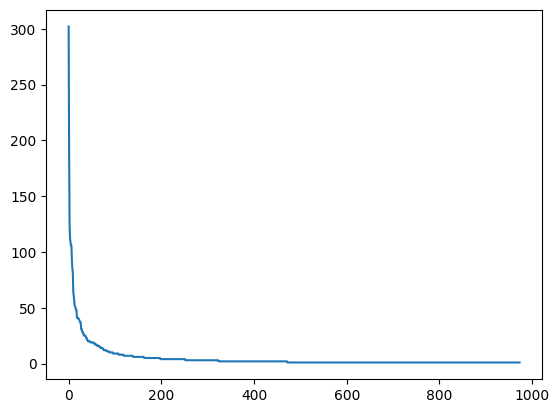

In [16]:
#Creating a figure and axis lets us do things like change the scaling or add a title
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(countedWords)), countedWords['count'])
plt.show()

This shows that likelihood of a word occurring is inversely proportional to its rank. This effect is called [Zipf's Law](https://en.wikipedia.org/wiki/Zipf%27s_law), and suggests that the most frequent word will occur approximately twice as often as the second most frequent word, three times as often as the third most frequent word, etc. Zipf's law is most easily observed by plotting the data on a log-log graph, with the axes being log (rank order) and log (frequency) resulting in a linear relationship.

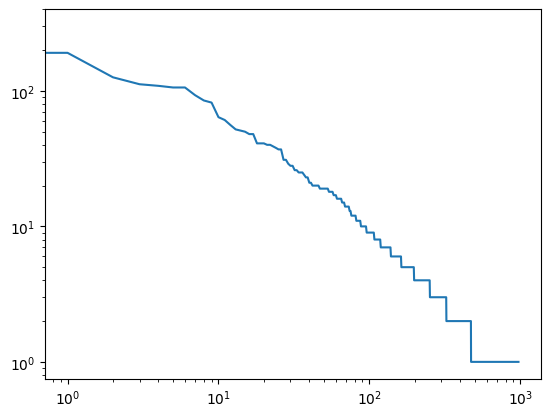

In [17]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(countedWords)), countedWords['count'])
ax.set_yscale('log')
ax.set_xscale('log')
plt.show()

(The same relationship occurs in many other rankings, such as population ranks of cities, corporation sizes, income rankings, etc.)

The distribution was imagined by Zipf to be driven by a principle of 'least effort' where speakers did not work any harder than necessary to communicate a given idea, but the basis for this relationship is still not well understood and conforms at least as well to a process of [preferential attachment](https://en.wikipedia.org/wiki/Preferential_attachment) whereby people disproportionately attend to popular words.


# Getting and working with raw text

First, we will retrieve a collection of press releases from a *GitHub API* that archived them, based on a number of analyses by Justin Grimmer, a political scientist whose work we will read in two weeks!

GitHub API requests are made to `'https://api.github.com/'` and responses are in JSON, similar to Tumblr's API.

We will get the information on [github.com/lintool/GrimmerSenatePressReleases](https://github.com/lintool/GrimmerSenatePressReleases) as it contains a nice set documents.

In [18]:
r = requests.get('https://api.github.com/repos/lintool/GrimmerSenatePressReleases')
senateReleasesData = json.loads(r.text)
print(senateReleasesData.keys())
print(senateReleasesData['description'])

dict_keys(['id', 'node_id', 'name', 'full_name', 'private', 'owner', 'html_url', 'description', 'fork', 'url', 'forks_url', 'keys_url', 'collaborators_url', 'teams_url', 'hooks_url', 'issue_events_url', 'events_url', 'assignees_url', 'branches_url', 'tags_url', 'blobs_url', 'git_tags_url', 'git_refs_url', 'trees_url', 'statuses_url', 'languages_url', 'stargazers_url', 'contributors_url', 'subscribers_url', 'subscription_url', 'commits_url', 'git_commits_url', 'comments_url', 'issue_comment_url', 'contents_url', 'compare_url', 'merges_url', 'archive_url', 'downloads_url', 'issues_url', 'pulls_url', 'milestones_url', 'notifications_url', 'labels_url', 'releases_url', 'deployments_url', 'created_at', 'updated_at', 'pushed_at', 'git_url', 'ssh_url', 'clone_url', 'svn_url', 'homepage', 'size', 'stargazers_count', 'watchers_count', 'language', 'has_issues', 'has_projects', 'has_downloads', 'has_wiki', 'has_pages', 'has_discussions', 'forks_count', 'mirror_url', 'archived', 'disabled', 'open_

What we are interested in here is the `'contents_url'`

In [19]:
print(senateReleasesData['contents_url'])

https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/{+path}


We can use this to get any or all of the files from the repo.

In [20]:
r = requests.get('https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse')
whitehouseLinks = json.loads(r.text)
whitehouseLinks[0]

{'name': '10Apr2007Whitehouse123.txt',
 'path': 'raw/Whitehouse/10Apr2007Whitehouse123.txt',
 'sha': 'f524289ee563dca58690c8d36c23dce5dbd9962a',
 'size': 2206,
 'url': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse/10Apr2007Whitehouse123.txt?ref=master',
 'html_url': 'https://github.com/lintool/GrimmerSenatePressReleases/blob/master/raw/Whitehouse/10Apr2007Whitehouse123.txt',
 'git_url': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/git/blobs/f524289ee563dca58690c8d36c23dce5dbd9962a',
 'download_url': 'https://raw.githubusercontent.com/lintool/GrimmerSenatePressReleases/master/raw/Whitehouse/10Apr2007Whitehouse123.txt',
 'type': 'file',
 '_links': {'self': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse/10Apr2007Whitehouse123.txt?ref=master',
  'git': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/git/blobs/f524289ee563dca58690c8d36c23dce5dbd9962a',
  'html': 'https:/

Now we have a list of information about Whitehouse press releases. Let's look at one of them.

In [21]:
r = requests.get(whitehouseLinks[0]['download_url'])
whitehouseRelease = r.text
print(whitehouseRelease[:1000])
len(whitehouseRelease)

SEN. WHITEHOUSE SHARES WESTERLY GIRL'S STORY IN PUSH FOR STEM CELL RESEARCH
  Sharing the story of Lila Barber, a 12 year old girl from Westerly, Sen. Sheldon Whitehouse (D-R.I.) on Tuesday, April 10, 2007, illustrated the hope stem cell research can offer in a speech on the Senate floor in favor of legislation to expand federal funding for stem cell research.  
   Whitehouse met Lila two weeks ago. She was diagnosed two years ago with osteosarcoma, a cancerous bone condition, and last year underwent cadaver bone transplant surgery. The procedure saved her leg and is helping her remain cancer-free, but the transplanted tissue will not grow with her and likely will break down over time. Stem cell research, Whitehouse explained, could vastly improve the care of patients like Lila by allowing surgeons to enhance transplants with a patient's own stem cells, which could replace the lost bone and cartilage, or grow entirely new replacement bones and joints. 
   "Stem cell research gives hope

2206

Now we have a string of correctly encoded text. For analysis of its words, next we need to tokenize it, or split it into a sequence of tokens or word instances.

In [22]:
whTokens = word_tokenize(whitehouseRelease)
whTokens[10:30]

['STEM',
 'CELL',
 'RESEARCH',
 'Sharing',
 'the',
 'story',
 'of',
 'Lila',
 'Barber',
 'a',
 '12',
 'year',
 'old',
 'girl',
 'from',
 'Westerly',
 'Sen.',
 'Sheldon',
 'Whitehouse',
 'D']

Previous iterations of the course used `nltk`s tokenizer, but as we saw before, we used spaCy's model (https://spacy.io/api/tokenizer). We intend to avoid using NLTK when we can - for production level code, it is a lot faster and cleaner to use spaCy.

That being said, `nltk` does have some useful methods for quick analysis of small corpora. We will explore a few here, and encourage you to figure out for yourself which other ones might be useful.

To use the list of tokens in `nltk`, and take advantage of functions like `concordance`, shown above, we can convert it into a `Text`.

In [23]:
import nltk

In [24]:
whText = nltk.Text(whTokens)

whitehouseIndex = nltk.text.ConcordanceIndex(whText)
whitehouseIndex.print_concordance('Whitehouse')

Displaying 5 of 5 matches:
ld girl from Westerly Sen. Sheldon Whitehouse D R.I. on Tuesday April 10 2007 il
ral funding for stem cell research Whitehouse met Lila two weeks ago She was dia
 down over time Stem cell research Whitehouse explained could vastly improve the
s research might help or even cure Whitehouse said Whitehouse also praised the e
 help or even cure Whitehouse said Whitehouse also praised the efforts of Rhode 


*Note* that the `Text` class is for doing rapid, exploratory analysis. It provides an easy interface to many of the operations we want to do, but it does not allow us much control over the particular operations it glosses. When you are doing a more complete analysis, you should be using the module specifically designed for that task instead of the shortcut method `Text` provides, e.g. use  [`collocations` Module](http://www.nltk.org/api/nltk.html#module-nltk.collocations) instead of `.collocations()`.

Now that we have gotten this loaded, let's glance at few features we will delve into more deeply later.

For example, we can find words that statistically tend to occur together and typically have a composite, idiomatic meaning irreducible to the semantics of its component words. We will do this later with more control over exactly how these are identified.

Or we can pick a word (or words) and find what words tend to occur around it.

In [25]:
whText.common_contexts(['stem'])

for_cell on_cells the_cell hope_cell time_cell own_cells joints_cell
of_cell embryonic_cells


We can also just count the number of times the word occurs.

In [26]:
whText.count('cell')

5


We can also plot each time a set of words occurs.

In [27]:
sns.reset_orig() #Seaborn messes with this plot, disabling it
whText.dispersion_plot(['Sen.','stem', 'cell', 'federal' ,'Lila', 'Barber', 'Whitehouse'])
sns.set() #Re-enabling seaborn

If we want to do an analysis of all the Whitehouse press releases we will first need to obtain them. By looking at the API we can see the the URL we want is [https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse](https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse), so we can create a function to scrape the individual files.

If you want to know more about downloading from APIs, refer back to the 1st notebook.

In [28]:
def getGithubFiles(target, maxFiles = 100):
    #We are setting a max so our examples don't take too long to run
    #For converting to a DataFrame
    releasesDict = {
        'name' : [], #The name of the file
        'text' : [], #The text of the file, watch out for binary files
        'path' : [], #The path in the git repo to the file
        'html_url' : [], #The url to see the file on Github
        'download_url' : [], #The url to download the file
    }

    #Get the directory information from Github
    r = requests.get(target)
    filesLst = json.loads(r.text)

    for fileDict in filesLst[:maxFiles]:
        #These are provided by the directory
        releasesDict['name'].append(fileDict['name'])
        releasesDict['path'].append(fileDict['path'])
        releasesDict['html_url'].append(fileDict['html_url'])
        releasesDict['download_url'].append(fileDict['download_url'])

        #We need to download the text though
        text = requests.get(fileDict['download_url']).text
        releasesDict['text'].append(text)

    return pandas.DataFrame(releasesDict)

whReleases = getGithubFiles('https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse', maxFiles = 10)
whReleases[:5]

,name,text,path,html_url,download_url
0,10Apr2007Whitehouse123.txt,SEN. WHITEHOUSE SHARES WESTERLY GIRL'S STORY I...,raw/Whitehouse/10Apr2007Whitehouse123.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
1,10Apr2008Whitehouse2.txt,SEN. WHITEHOUSE SAYS PRESIDENT BUSH MUST BEGIN...,raw/Whitehouse/10Apr2008Whitehouse2.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
2,10Apr2008Whitehouse3.txt,EPA MUST REVIEW LEGAL PROCESS TO ROOT OUT POLI...,raw/Whitehouse/10Apr2008Whitehouse3.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
3,10Aug2007Whitehouse78.txt,R.I. SENATORS PRAISE SEN. DENIAL OF LNG FACILI...,raw/Whitehouse/10Aug2007Whitehouse78.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
4,10Jan2008Whitehouse35.txt,SEN. WHITEHOUSE COMMENTS ON ONE-YEAR ANNIVERSA...,raw/Whitehouse/10Jan2008Whitehouse35.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...


If you are having trouble downloading the data uncomment this next cell

In [29]:
#whReleases = pandas.read_csv('../data/whReleases.csv')

Now we have all the texts in a DataFrame we can look at a few things.

First let's tokenize the texts with the same tokenizer as we used before. We will just save the tokens as a list for now; no need to convert to `Text`s.

In [234]:
whReleases['tokenized_text'] = whReleases['text'].apply(lambda x: word_tokenize(x))

c:\Users\caiyu\AppData\Local\Programs\Python\Python311\Lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Now lets see how long each of the press releases is:

In [233]:
whReleases['word_counts'] = whReleases['tokenized_text'].apply(lambda x: len(x))
whReleases['word_counts']

0     344
1     165
2    2809
3     158
4     604
5     616
6     152
7    1455
8    1030
9    2910
Name: word_counts, dtype: int64

## <font color="red">*Exercise 1*</font>

<font color="red">Construct cells immediately below this that input and interrogate a corpus relating to your anticipated final project. This could include one of the Davies corpora or some other you have constructed. Turn your text into an nltk `Text` object, and explore all of the features examined above, and others that relate to better understanding your corpus in relation to your research question. </font>

# FOR COCA CORPUS

In [32]:
COCAcorpus_name = 'D:/data/macss/MACS60000/week2/twitter/'
# corpus_name = "Movies"

In [33]:
def loadcorpus(corpus_name):
    texts_raw = {}
    for file in os.listdir(corpus_name):
        if file.endswith('.gz'):
            print(f"Processing GZ file: {file}")
            filepath = os.path.join(corpus_name, file)
            with gzip.open(filepath, 'rt', encoding='utf-8') as f:
                # Assume the file is a .tsv file inside the .gz archive
                tsv_filename = file.replace('.gz', '')
                texts_raw[tsv_filename] = list(csv.reader(f, delimiter='\t'))
    return texts_raw

In [34]:
COCAcorpus_name = 'D:/data/macss/MACS60000/week2/COCA/'


In [35]:
def loadcorpus(corpus_name, corpus_style="text"):
    texts_raw = {}
    for file in os.listdir(corpus_name + "/"):
        if corpus_style in file:
            print(file)
            zfile = zipfile.ZipFile(corpus_name + "/" + file)
            for file in zfile.namelist():
                texts_raw[file] = []
                with zfile.open(file) as f:
                    for line in f:
                        texts_raw[file].append(line)
    return texts_raw

In [36]:
COCA_raw = loadcorpus(COCAcorpus_name)

text_2012-2015_ksr.zip


text_academic_rpe.zip
text_fiction_awq.zip
text_magazine_jex.zip
text_newspaper_lsp.zip
text_spoken_kde.zip


In [37]:
COCA_raw['w_spok_2012.txt'][0:100]

[b'\r\n',
 b'##4103509 @!ROBIN-ROBERTS-@1-A# @(Off-camera) Good evening , everyone . It was n\'t the usual his-and-her split-up of assets in a divorce settlement , now all these belonged to him to be used on her . 65 pounds of explosives , a pair of handcuffs , a gun and a rope to be turned into a noose . And what had been their home now wired with surveillance equipment , so nobody could get in and no one could get out . @!ROBIN-ROBERTS-@1-A# @(Voiceover) Just three weeks ago , Nancy Tyler , with her children by her side , walked into court for what she hopes will be the final chapter in a disturbing and violent saga . @!NANCY-TYLER-@1RICH# Over the years leading up to the kidnapping , Mr. Shenkman stalked me ... @!ROBIN-ROBERTS-@1-A# @(Voiceover) As she reads from her victim \'s impact statement in this Connecticut courtroom , the man who has tormented her looks on , her ex-husband of 12 years , Richard Shenkman. @!NANCY-TYLER-@1RICH# Mr. Shenkman named his battle the war of the Tyle

In [38]:
nlp = spacy.load("en_core_web_sm")

In [39]:
def clean_raw_text(raw_texts):
    clean_texts = []
    for text in raw_texts:
        try:
            text = text.decode("utf-8")
            clean_text = text.replace(" \'m", "'m").replace(" \'ll", "'ll").replace(" \'re", "'re").replace(" \'s", "'s").replace(" \'re", "'re").replace(" n\'t", "n't").replace(" \'ve", "'ve").replace(" /'d", "'d")
            clean_texts.append(clean_text)
        except AttributeError:
            # print("ERROR CLEANING")
            # print(text)
            continue
        except UnicodeDecodeError:
            # print("Unicode Error, Skip")
            continue
    return clean_texts

In [40]:
clean_coca12 = clean_raw_text(COCA_raw['w_spok_2012.txt'])

In [41]:
def word_tokenize(word_list):
    tokenized = []
    # pass word list through language model.
    doc = nlp(word_list)
    for token in doc:
        if not token.is_punct and len(token.text.strip()) > 0:
            tokenized.append(token.text)
    return tokenized

In [42]:
word_tokenize(clean_coca12[1])

['4103509',
 '@!ROBIN',
 'ROBERTS-@1',
 'A',
 '@(Off',
 'camera',
 'Good',
 'evening',
 'everyone',
 'It',
 'was',
 "n't",
 'the',
 'usual',
 'his',
 'and',
 'her',
 'split',
 'up',
 'of',
 'assets',
 'in',
 'a',
 'divorce',
 'settlement',
 'now',
 'all',
 'these',
 'belonged',
 'to',
 'him',
 'to',
 'be',
 'used',
 'on',
 'her',
 '65',
 'pounds',
 'of',
 'explosives',
 'a',
 'pair',
 'of',
 'handcuffs',
 'a',
 'gun',
 'and',
 'a',
 'rope',
 'to',
 'be',
 'turned',
 'into',
 'a',
 'noose',
 'And',
 'what',
 'had',
 'been',
 'their',
 'home',
 'now',
 'wired',
 'with',
 'surveillance',
 'equipment',
 'so',
 'nobody',
 'could',
 'get',
 'in',
 'and',
 'no',
 'one',
 'could',
 'get',
 'out',
 '@!ROBIN',
 'ROBERTS-@1',
 'A',
 '@(Voiceover',
 'Just',
 'three',
 'weeks',
 'ago',
 'Nancy',
 'Tyler',
 'with',
 'her',
 'children',
 'by',
 'her',
 'side',
 'walked',
 'into',
 'court',
 'for',
 'what',
 'she',
 'hopes',
 'will',
 'be',
 'the',
 'final',
 'chapter',
 'in',
 'a',
 'disturbing',
 'a

In [43]:
def wordCounter(wordLst):
    wordCounts = {}
    for word in wordLst:
        #We usually need to normalize the case
        wLower = word.lower()
        if wLower in wordCounts:
            wordCounts[wLower] += 1
        else:
            wordCounts[wLower] = 1
    #convert to DataFrame
    countsForFrame = {'word' : [], 'count' : []}
    for w, c in wordCounts.items():
        countsForFrame['word'].append(w)
        countsForFrame['count'].append(c)
    return pandas.DataFrame(countsForFrame)

In [44]:
countedWords = wordCounter(word_tokenize(clean_coca12[1]))
countedWords[:10]

,word,count
0,4103509,1
1,@!robin,94
2,roberts-@1,94
3,a,228
4,@(off,24
5,camera,24
6,good,3
7,evening,1
8,everyone,3
9,it,80


In [45]:
countedWords.sort_values('count', ascending=False, inplace=True)
countedWords[:100]

,word,count
3,a,228
12,the,226
28,to,181
123,i,166
15,and,165
...,...,...
56,no,11
137,make,11
83,years,11
46,their,11


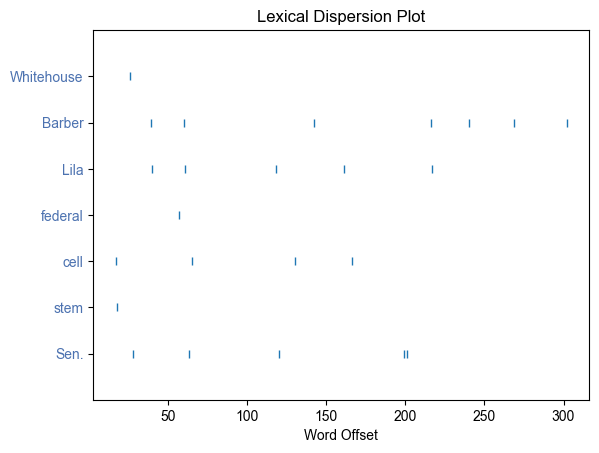

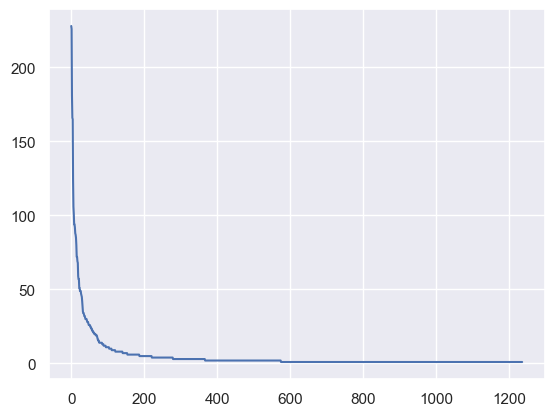

In [46]:
#Creating a figure and axis lets us do things like change the scaling or add a title
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(countedWords)), countedWords['count'])
plt.show()

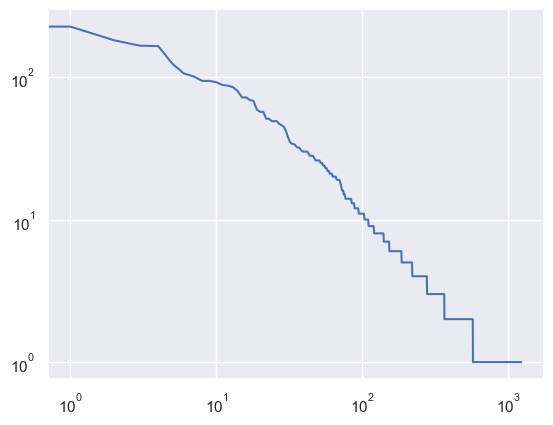

In [47]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(countedWords)), countedWords['count'])
ax.set_yscale('log')
ax.set_xscale('log')
plt.show()

In [48]:
whTokens2 = word_tokenize(clean_coca12[1])
whTokens2[10:]

['was',
 "n't",
 'the',
 'usual',
 'his',
 'and',
 'her',
 'split',
 'up',
 'of',
 'assets',
 'in',
 'a',
 'divorce',
 'settlement',
 'now',
 'all',
 'these',
 'belonged',
 'to',
 'him',
 'to',
 'be',
 'used',
 'on',
 'her',
 '65',
 'pounds',
 'of',
 'explosives',
 'a',
 'pair',
 'of',
 'handcuffs',
 'a',
 'gun',
 'and',
 'a',
 'rope',
 'to',
 'be',
 'turned',
 'into',
 'a',
 'noose',
 'And',
 'what',
 'had',
 'been',
 'their',
 'home',
 'now',
 'wired',
 'with',
 'surveillance',
 'equipment',
 'so',
 'nobody',
 'could',
 'get',
 'in',
 'and',
 'no',
 'one',
 'could',
 'get',
 'out',
 '@!ROBIN',
 'ROBERTS-@1',
 'A',
 '@(Voiceover',
 'Just',
 'three',
 'weeks',
 'ago',
 'Nancy',
 'Tyler',
 'with',
 'her',
 'children',
 'by',
 'her',
 'side',
 'walked',
 'into',
 'court',
 'for',
 'what',
 'she',
 'hopes',
 'will',
 'be',
 'the',
 'final',
 'chapter',
 'in',
 'a',
 'disturbing',
 'and',
 'violent',
 'saga',
 '@!NANCY',
 'TYLER-@1RICH',
 'Over',
 'the',
 'years',
 'leading',
 'up',
 'to',

In [49]:
import nltk

In [50]:
whText2 = nltk.Text(whTokens2)

whitehouseIndex = nltk.text.ConcordanceIndex(whText2)
whitehouseIndex.print_concordance('disturbing')

Displaying 2 of 2 matches:
pes will be the final chapter in a disturbing and violent saga @!NANCY TYLER-@1R
IN ROBERTS-@1 A @(Voiceover In one disturbing email Shenkman wrote This divorce 


In [51]:
whText2.common_contexts(['disturbing'])

a_and one_email


In [52]:
sns.reset_orig() #Seaborn messes with this plot, disabling it
whText2.dispersion_plot(['disturbing.','crazy', 'mind'])
sns.set() #Re-enabling seaborn

In [53]:
data = [
    {'text': 'Some text here.', 'other_attribute': 'value1'},
    {'text': 'More text here.', 'other_attribute': 'value2'},
    # ...and so on
]

# Convert list of dictionaries to DataFrame
clean_coca12 = pandas.DataFrame(data)

# Now you can access the 'text' column and apply your function
clean_coca12['tokenized_text'] = clean_coca12['text'].apply(lambda x: word_tokenize(x))

In [54]:
print(clean_coca12.columns)

Index(['text', 'other_attribute', 'tokenized_text'], dtype='object')


In [55]:
clean_coca12['word_counts'] = clean_coca12['tokenized_text'].apply(lambda x: len(x))
clean_coca12['word_counts']

0    3
1    3
Name: word_counts, dtype: int64

# For Twitter

In [56]:
def loadcorpus(corpus_name, corpus_style=".json.bz2"):
    texts_raw = {}
    for file_name in os.listdir(corpus_name):
        if file_name.endswith(corpus_style):
            print(f"Processing file: {file_name}")
            file_path = os.path.join(corpus_name, file_name)
            with bz2.open(file_path, 'rt', encoding='utf-8') as bz2_file:
                texts_raw[file_name] = [json.loads(line) for line in bz2_file]
    return texts_raw

# Use the loadcorpus function to read the contents of the .json.bz2 files
# Replace 'your_directory_path' with the path to the directory containing your .json.bz2 files.
directory = 'D:/data/macss/MACS60000/twitter-stream-20230101/2023/1/1/0'

In [57]:
twitter_raw = loadcorpus(directory)

Processing file: 0.json.bz2


Processing file: 1.json.bz2
Processing file: 10.json.bz2
Processing file: 11.json.bz2
Processing file: 12.json.bz2
Processing file: 13.json.bz2
Processing file: 14.json.bz2
Processing file: 15.json.bz2
Processing file: 16.json.bz2
Processing file: 17.json.bz2
Processing file: 18.json.bz2
Processing file: 19.json.bz2
Processing file: 2.json.bz2
Processing file: 20.json.bz2
Processing file: 21.json.bz2
Processing file: 22.json.bz2
Processing file: 23.json.bz2
Processing file: 24.json.bz2
Processing file: 25.json.bz2
Processing file: 26.json.bz2
Processing file: 27.json.bz2
Processing file: 28.json.bz2
Processing file: 29.json.bz2
Processing file: 3.json.bz2
Processing file: 30.json.bz2
Processing file: 31.json.bz2
Processing file: 32.json.bz2
Processing file: 33.json.bz2
Processing file: 34.json.bz2
Processing file: 35.json.bz2
Processing file: 36.json.bz2
Processing file: 37.json.bz2
Processing file: 38.json.bz2
Processing file: 39.json.bz2
Processing file: 4.json.bz2
Processing file: 4

In [58]:
first_three_entries = twitter_raw.get('1.json.bz2', [])[:3]
print(first_three_entries)

[{'data': {'attachments': {}, 'author_id': '2217834307', 'context_annotations': [{'domain': {'id': '10', 'name': 'Person', 'description': 'Named people in the world like Nelson Mandela'}, 'entity': {'id': '1256352299514867712', 'name': 'Yuichi Nakamaru', 'description': '中丸 雄一\u3000KAT-TUN'}}, {'domain': {'id': '46', 'name': 'Business Taxonomy', 'description': 'Categories within Brand Verticals that narrow down the scope of Brands'}, 'entity': {'id': '1557696802391859201', 'name': 'Entertainment & Leisure Business', 'description': 'Brands, companies, advertisers and every non-person handle with the profit intent related to movies, music, television, franchises, venues, theme parks, toys, tourism, hotels'}}, {'domain': {'id': '54', 'name': 'Musician', 'description': 'A musician in the world, like Adele or Bob Dylan'}, 'entity': {'id': '1256352299514867712', 'name': 'Yuichi Nakamaru', 'description': '中丸 雄一\u3000KAT-TUN'}}, {'domain': {'id': '55', 'name': 'Music Genre', 'description': 'A c

In [59]:
# Function to read and parse .bz2 JSON files
def read_and_parse_bz2_json(file_path):
    with bz2.open(file_path, 'rt', encoding='utf-8') as bz2_file:
        return [json.loads(line) for line in bz2_file]

# Function to clean the text field in JSON objects
def clean_raw_text(json_objects):
    clean_texts = []
    for json_obj in json_objects:
        # Ensure 'data' is a dictionary and it contains 'text'
        if isinstance(json_obj.get('data'), dict) and 'text' in json_obj['data']:
            text = json_obj['data']['text']
            clean_text = text.replace("\\'", "'").replace('\\"', '"').replace('\\r', '').replace('\\n', '').replace('\\t', '').replace('\\\\', '\\')
            clean_texts.append(clean_text)
        else:
            # Handle unexpected JSON structure
            print(f"Unexpected JSON structure: {json_obj}")
    return clean_texts

# Path to your .json.bz2 file
file_path = 'D:/data/macss/MACS60000/twitter-stream-20230101/2023/1/1/0/1.json.bz2'

# Read and parse the .bz2 JSON file
parsed_json = read_and_parse_bz2_json(file_path)

# Clean the text field in JSON objects
clean_texts = clean_raw_text(parsed_json)

# Print out the cleaned texts
print(clean_texts[:1000])

['生広末だって時にロバ丸居たんだっけ\n\n#新春シューイチ\n#中丸雄一\u3000中丸くん', '@yunox1103 ゆのさんあけましておめでとうございます！\nイベントそこまで頻繁にいかないと思いますが、被ったりしたらまたおしゃべりしましょー！\n今年もよろしくどうぞ！', 'RT @hourIytaylor: https://t.co/OQA2L5q5x3', 'RT @MMint2789: เป็นปีที่ดีสำหรับเด็กน้อยไบร์ทวินนะ\n#winmetawin #bbrightvc #ไบร์ทวิน https://t.co/qpEV7vFSbm', '@icebluegguk "Todos os pontos azuis em mim haviam sido feitos, desenhados, pintados e criados por Benjamin Park, o garoto que segurava a minha mão naquele instante, que sentia todas aquelas coisas comigo, que proporcionava-me muito mais do que eu sonhei em toda minha vida."', 'RT @BamBam1A: ร้อนกันไหมครับ?😢\n\nต้องการอะไร บอกันได้นะครับ\nบอกใน #ฉันต้องการ นะครับ\nเดียวจะเช็ค แล้วพยายาม feedback ให้ทุกคนนะครับ ㅜ', 'イズモノハクトで色々出来そう\nトカチオリヴィ試したら毎ターン単体A+全体Dの2回行動が結構熱い', 'Happy New Year everyone 2023 is here in UK👍', 'RT @kinpuruofficial: 🎍☀️🎍☀️🎍☀️🎍☀️🎍☀️🎍☀️\n\n明けましておめでとうございます！\n\n\u3000  本日 よる11時30分からは\n\u3000#キンプる元日スペシャル 👑\n\n🎍☀️🎍☀️🎍☀️🎍☀️🐰🎍☀️🎍\n\n#今年も宜しくお願いします\n#DASH夜ふかしキンプ…', 'RT @ProgressBar202

In [60]:
# nlp_ja = spacy.load("ja_core_news_sm")
nlp = spacy.load("en_core_web_sm")

In [61]:
def clean_raw_text(raw_texts):
    clean_texts = []
    for text in raw_texts:
        try:
            text = text.decode("utf-8")
            clean_text = text.replace(" \'m", "'m").replace(" \'ll", "'ll").replace(" \'re", "'re").replace(" \'s", "'s").replace(" \'re", "'re").replace(" n\'t", "n't").replace(" \'ve", "'ve").replace(" /'d", "'d")
            clean_texts.append(clean_text)
        except AttributeError:
            # print("ERROR CLEANING")
            # print(text)
            continue
        except UnicodeDecodeError:
            # print("Unicode Error, Skip")
            continue
    return clean_texts

In [62]:
clean_tw = clean_texts

In [63]:
def word_tokenize(word_list):
    tokenized = []
    # pass word list through language model.
    doc = nlp(word_list)
    for token in doc:
        if not token.is_punct and len(token.text.strip()) > 0:
            tokenized.append(token.text)
    return tokenized

In [64]:
word_tokenize(clean_tw[10])

['@greg16676935420',
 'What',
 'kinda',
 'country',
 'do',
 'we',
 'live',
 'in',
 'where',
 'a',
 'man',
 'ca',
 'n’t',
 'even',
 'order',
 'a',
 'wrapper']

In [65]:
def wordCounter(wordLst):
    wordCounts = {}
    for word in wordLst:
        #We usually need to normalize the case
        wLower = word.lower()
        if wLower in wordCounts:
            wordCounts[wLower] += 1
        else:
            wordCounts[wLower] = 1
    #convert to DataFrame
    countsForFrame = {'word' : [], 'count' : []}
    for w, c in wordCounts.items():
        countsForFrame['word'].append(w)
        countsForFrame['count'].append(c)
    return pandas.DataFrame(countsForFrame)

In [66]:
twcountedWords = wordCounter(word_tokenize(clean_tw[10]))
twcountedWords[:10]

,word,count
0,@greg16676935420,1
1,what,1
2,kinda,1
3,country,1
4,do,1
5,we,1
6,live,1
7,in,1
8,where,1
9,a,2


In [67]:
twcountedWords.sort_values('count', ascending=False, inplace=True)
twcountedWords[:100]

,word,count
9,a,2
0,@greg16676935420,1
1,what,1
2,kinda,1
3,country,1
4,do,1
5,we,1
6,live,1
7,in,1
8,where,1


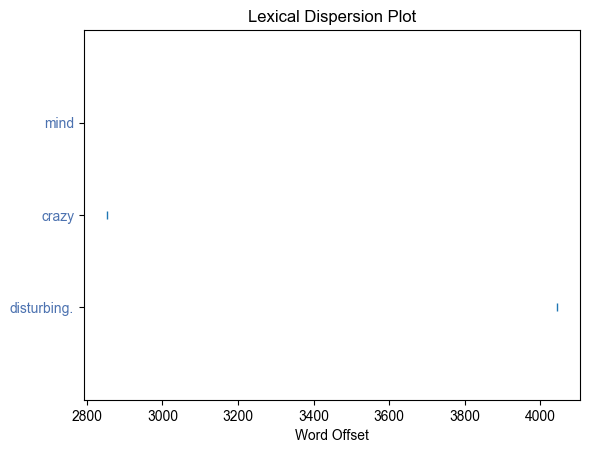

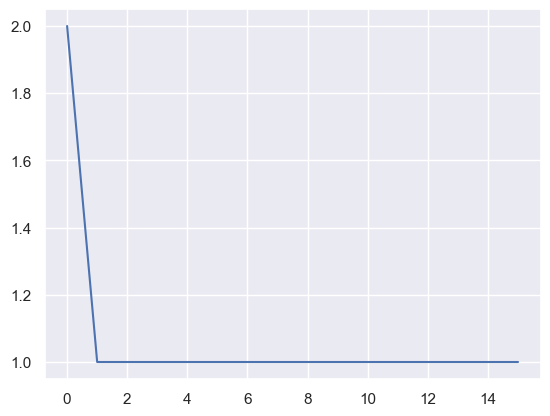

In [68]:
#Creating a figure and axis lets us do things like change the scaling or add a title
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(twcountedWords)), twcountedWords['count'])
plt.show()

# Filtering and normalizing text

As we want to start comparing the different releases we may choose to do a bit of filtering and normalizing that will allow us to focus on what we most care about. We can first make all of the words lower case, then drop the non-word tokens. Next, we can remove some 'stop words', stem the remaining words to remove suffixes, prefixes and (in some languages) infixes, or lemmatize tokens by intelligently grouping inflected or variant forms of the same word (e.g., with a stemmer and a dictionary).

To begin this process, we will first define a function to work over the tokenized lists, then another to add normalized tokens to a new column.

We will be using spaCy's built in stop words identifying capacity. When we run text through spaCy's language pipeline, it automatically tags it as a stop word.

We can remove these stopwords from the analysis by fiat, but we could also take a more principled approach by looking at the frequency distribution of words and selecting a specific cut-off associated with the preservation of 'meaningful words' identified upon inspection. Alternatively, we could automatically set a cut-off by rule, such as removal of all words more frequent then the most frequent verb, or the most frequent noun (not pronoun), or some term of central interest.

In [69]:
countsDict = {}
for word in whReleases['tokenized_text'].sum():
    if word in countsDict:
        countsDict[word] += 1
    else:
        countsDict[word] = 1
word_counts = sorted(countsDict.items(), key = lambda x : x[1], reverse = True)
word_counts[:20]

[('the', 179),
 ('of', 112),
 ('to', 112),
 ('and', 108),
 ('in', 64),
 ('a', 61),
 ("'s", 50),
 ('that', 41),
 ('our', 39),
 ('for', 35),
 ('on', 33),
 ('is', 33),
 ('Whitehouse', 31),
 ('Iraq', 28),
 ('Bush', 27),
 ('President', 25),
 ('troops', 21),
 ('by', 19),
 ('American', 19),
 ('with', 18)]

We can look at this and pick the cutoff, often at the first noun. So we will cut all words before `'Whitehouse'`.

In [70]:
#The stop list is then all words that occur before the first noun
stop_words_freq = []
for word, count in word_counts:
    if word == 'Whitehouse':
        break
    else:
        stop_words_freq.append(word)
stop_words_freq

['the', 'of', 'to', 'and', 'in', 'a', "'s", 'that', 'our', 'for', 'on', 'is']

If we did have any extra words to add as stop words apart from those normally considered as stop words, we would add it to our stop words by passing it to the normalize tokens method.

Now we can create our function to normalize the tokens

In [244]:
def normalizeTokens(word_list, extra_stop=[]):
    #We can use a generator here as we just need to iterate over it
    normalized = []
    if type(word_list) == list and len(word_list) == 1:
        word_list = word_list[0]

    if type(word_list) == list:
        word_list = ' '.join([str(elem) for elem in word_list])

    doc = nlp(word_list.lower())

    # add the property of stop word to words considered as stop words
    if len(extra_stop) > 0:
        for stopword in extra_stop:
            lexeme = nlp.vocab[stopword]
            lexeme.is_stop = True

    for w in doc:
        # if it's not a stop word or punctuation mark, add it to our article
        if w.text != '\n' and not w.is_stop and not w.is_punct and not w.like_num and len(w.text.strip()) > 0:
            # we add the lematized version of the word
            normalized.append(str(w.lemma_))

    return normalized

In [245]:
whReleases['normalized_tokens'] = whReleases['tokenized_text'].apply(lambda x: normalizeTokens(x))

whReleases['normalized_tokens_count'] = whReleases['normalized_tokens'].apply(lambda x: len(x))

whReleases

,name,text,path,html_url,download_url,tokenized_text,word_counts,normalized_tokens,normalized_tokens_count
0,ant_anatomy.json,"{\n ""description"": ""Hymenoptera (ant, bee, was...",data/animals/ant_anatomy.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, Hymenoptera, ant, bee, wasp, bod...",344,"[description, hymenoptera, ant, bee, wasp, bod...",280
1,birds_antarctica.json,"{\n ""description"": ""Birds of Antarctica, grou...",data/animals/birds_antarctica.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, Birds, of, Antarctica, grouped, ...",165,"[description, bird, antarctica, group, family,...",157
2,birds_north_america.json,"{\n ""description"": ""Birds of North America, g...",data/animals/birds_north_america.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, Birds, of, North, America, group...",2809,"[description, bird, north, america, group, fam...",2654
3,cats.json,"{\r\n ""description"": ""A list of cat breeds"",...",data/animals/cats.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, A, list, of, cat, breeds, cats, ...",158,"[description, list, cat, breed, cat, abyssinia...",155
4,cephalopod_anatomy.json,"{\n ""description"": ""Cephalopod body parts. Fro...",data/animals/cephalopod_anatomy.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, Cephalopod, body, parts, From, t...",604,"[description, cephalopod, body, part, obo, cep...",571
5,collateral_adjectives.json,"{\n ""description"":""Collateral adjectives for...",data/animals/collateral_adjectives.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description"":""Collateral, adjectives, for, an...",616,"[description"":""collateral, adjective, animal, ...",613
6,common.json,"{\n ""description"": ""A list of common types of...",data/animals/common.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, A, list, of, common, types, of, ...",152,"[description, list, common, type, animal, anim...",149
7,dinosaurs.json,"{\n ""description"": ""A list of dinosaurs."",\n ...",data/animals/dinosaurs.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, A, list, of, dinosaurs, dinosaur...",1455,"[description, list, dinosaur, dinosaur, kangna...",1453
8,dog_names.json,"{\n ""description"": ""1000 popular dog names fr...",data/animals/dog_names.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[description, 1000, popular, dog, names, from,...",1030,"[description, popular, dog, name, new, york, c...",1015
9,dogs-en-de.json,"[\n {\n ""name"": ""Affenpinscher"",\n ""nam...",data/animals/dogs-en-de.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...,"[name, Affenpinscher, name_de, Affenpinscher, ...",2910,"[affenpinscher, name_de, affenpinscher, afghan...",2443


You can see that in the final step of normalizing, we add the lemmatized form of the word. spaCy's built in lemmatizer does this (https://spacy.io/api/lemmatizer). Lemmatization can be thought of as finding the root or the base of the word after removing inflections and other variations of words. Another possible way of finding the roots of words is using NLTK's porting or stemming functionalities, but we will not be getting into them.

Now that it is cleaned we start analyzing the dataset. We can start by finding frequency distributions for the dataset. Lets start looking at all the press releases together. The [`ConditionalFreqDist`](http://www.nltk.org/api/nltk.html#nltk.probability.ConditionalProbDist) class reads in an iterable of tuples, the first element is the condition and the second the focal word. For starters, we will use word lengths as the conditions, but tags or clusters will provide more useful results.

In [73]:
#.sum() adds together the lists from each row into a single list
whcfdist = nltk.ConditionalFreqDist(((len(w), w) for w in whReleases['normalized_tokens'].sum()))

#print the number of words
print(whcfdist.N())

1964


From this we can lookup the distributions of different word lengths

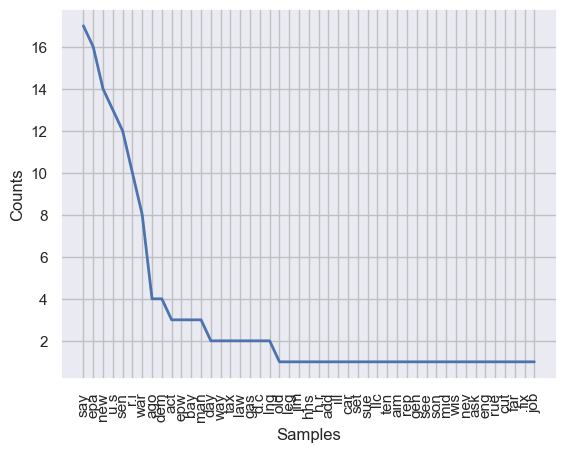

<Axes: xlabel='Samples', ylabel='Counts'>

In [74]:
whcfdist[3].plot()

We can also create a Conditional Probability Distribution or [`ConditionalProbDist`](http://www.nltk.org/api/nltk.html#nltk.probability.ConditionalProbDist) from the `ConditionalFreqDist`. To do this, however, we need a model for the probability distribution. A simple model is [`ELEProbDist`](http://www.nltk.org/api/nltk.html#nltk.probability.ELEProbDist) which gives the expected likelihood estimate for the probability distribution of the experiment used to generate the observed frequency distribution.

In [75]:
whcpdist = nltk.ConditionalProbDist(whcfdist, nltk.ELEProbDist)

#print the most common 2 letter word
print(whcpdist[2].max())

#And its probability
print(whcpdist[2].prob(whcpdist[2].max()))

ri
0.25


Length is one feature of a word, but there are many more important features we care about. Another critical feature is a word's role in the sentence, or its part of speech (POS).

The method below works similarly to ```nltk.pos_text```, and can work with the conditional frequency distributions it provides.

In [76]:
def spacy_pos(word_list):
    tags = []
    doc = nlp(word_list.lower())
    for w in doc:
        tags.append((w.text, w.tag_))
    return tags

In [77]:
whReleases['normalized_tokens_POS'] = [spacy_pos(t) for t in whReleases['text']]

This gives us a new column with the part of speech as a short initialism and the word in a tuple, exactly how the `nltk.ConditionalFreqDist()` function wants them. We can now construct another conditional frequency distribution.

In [78]:
whcfdist_WordtoPOS = nltk.ConditionalFreqDist(whReleases['normalized_tokens_POS'].sum())
list(whcfdist_WordtoPOS.items())[:10]

[('sen', FreqDist({'NNP': 9})),
 ('.', FreqDist({'.': 126, 'NNP': 39, 'NN': 1})),
 ('whitehouse', FreqDist({'NN': 21, 'NNP': 19})),
 ('shares', FreqDist({'NNS': 1})),
 ('westerly', FreqDist({'RB': 2})),
 ('girl', FreqDist({'NN': 2})),
 ("'s", FreqDist({'POS': 47, 'VBZ': 5})),
 ('story', FreqDist({'NN': 2})),
 ('in', FreqDist({'IN': 72})),
 ('push', FreqDist({'NN': 1}))]

This gives the frequency of each word as each part of speech...which can be uninformative and boring. What we want is the converse; the frequency of each part of speech for each word.

In [79]:
whcfdist_POStoWord = nltk.ConditionalFreqDist((p, w) for w, p in whReleases['normalized_tokens_POS'].sum())

We can now identify and collect all of the superlative adjectives

In [80]:
whcfdist_POStoWord['JJ']

FreqDist({'american': 17, 'new': 11, 'portuguese': 9, 'political': 8, 'federal': 6, 'clear': 5, 'general': 5, 'potential': 5, 'fiscal': 5, 'last': 4, ...})

Or look at the most common nouns

In [81]:
whcfdist_POStoWord['NN'].most_common(5)

[('whitehouse', 21),
 ('rhode', 19),
 ('island', 15),
 ('today', 15),
 ('stem', 12)]

Or plot the base form verbs against their number of occurrences

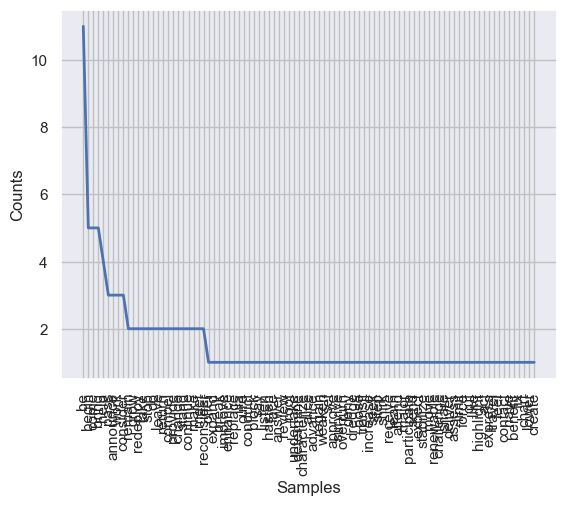

<Axes: xlabel='Samples', ylabel='Counts'>

In [82]:
whcfdist_POStoWord['VB'].plot()

We can then do a similar analysis of the word probabilities

In [83]:
whcpdist_POStoWord = nltk.ConditionalProbDist(whcfdist_POStoWord, nltk.ELEProbDist)

#print the most common nouns
print(whcpdist_POStoWord['NN'].max())

#And its probability
print(whcpdist_POStoWord['NN'].prob(whcpdist_POStoWord['NN'].max()))

whitehouse
0.025190392501464556


We can even create a...wait for it...*WORD CLOUD* or Wordl to gaze at and draw mystical, approximate inferences about important nouns and verbs in our corpus:

In [84]:
wc = wordcloud.WordCloud(background_color="white", max_words=500, width= 1000, height = 1000, mode ='RGBA', scale=.5).generate(' '.join(whReleases['normalized_tokens'].sum()))
plt.imshow(wc)
plt.axis("off")
plt.savefig("whitehouse_word_cloud.pdf", format = 'pdf')

## <font color="red">*Exercise 2*</font>

<font color="red">Construct cells immediately below this that filter, stem and lemmatize the tokens in your corpus, and then creates plots (with titles and labels) that map the word frequency distribution, word probability distribution, and at least two conditional probability distributions that help us better understand the social and cultural game underlying the production of your corpus. Create a wordl of words (or normalized words) and add a few vague comments about what mysteries are revealed through it.</font>

In [85]:
whReleases

,name,text,path,html_url,download_url,tokenized_text,word_counts,normalized_tokens,normalized_tokens_count,normalized_tokens_POS
0,10Apr2007Whitehouse123.txt,SEN. WHITEHOUSE SHARES WESTERLY GIRL'S STORY I...,raw/Whitehouse/10Apr2007Whitehouse123.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, SHARES, WESTERLY, GIRL, 'S, ...",350,"[sen, whitehouse, share, westerly, girl, story...",224,"[(sen, NNP), (., NNP), (whitehouse, NNP), (sha..."
1,10Apr2008Whitehouse2.txt,SEN. WHITEHOUSE SAYS PRESIDENT BUSH MUST BEGIN...,raw/Whitehouse/10Apr2008Whitehouse2.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, SAYS, PRESIDENT, BUSH, MUST,...",311,"[sen, whitehouse, say, president, bush, begin,...",159,"[(sen, NNP), (., NNP), (whitehouse, NNP), (say..."
2,10Apr2008Whitehouse3.txt,EPA MUST REVIEW LEGAL PROCESS TO ROOT OUT POLI...,raw/Whitehouse/10Apr2008Whitehouse3.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[EPA, MUST, REVIEW, LEGAL, PROCESS, TO, ROOT, ...",497,"[epa, review, legal, process, root, political,...",298,"[(epa, NNP), (must, MD), (review, VB), (legal,..."
3,10Aug2007Whitehouse78.txt,R.I. SENATORS PRAISE SEN. DENIAL OF LNG FACILI...,raw/Whitehouse/10Aug2007Whitehouse78.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[R.I., SENATORS, PRAISE, SEN, DENIAL, OF, LNG,...",189,"[r.i, senator, praise, sen, denial, lng, facil...",116,"[(r.i, NNP), (., NNP), (senators, NNS), (prais..."
4,10Jan2008Whitehouse35.txt,SEN. WHITEHOUSE COMMENTS ON ONE-YEAR ANNIVERSA...,raw/Whitehouse/10Jan2008Whitehouse35.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, COMMENTS, ON, ONE, YEAR, ANN...",236,"[sen, whitehouse, comment, year, anniversary, ...",125,"[(sen, NNP), (., NNP), (whitehouse, NNP), (com..."
5,10Mar2008Whitehouse8.txt,"SENS. REED, WHITEHOUSE WELCOME RHODE ISLAND ST...",raw/Whitehouse/10Mar2008Whitehouse8.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SENS, REED, WHITEHOUSE, WELCOME, RHODE, ISLAN...",334,"[sen, reed, whitehouse, welcome, rhode, island...",197,"[(sens, NNS), (., .), (reed, NNP), (,, ,), (wh..."
6,10Sep2007Whitehouse72.txt,REP. WHITEHOUSE ISSUES STATEMENT ON GEN. PETRA...,raw/Whitehouse/10Sep2007Whitehouse72.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[REP, WHITEHOUSE, ISSUES, STATEMENT, ON, GEN, ...",241,"[rep, whitehouse, issue, statement, gen, petra...",118,"[(rep, NNP), (., NNP), (whitehouse, NNP), (iss..."
7,11Apr2007Whitehouse122.txt,SEN. WHITEHOUSE URGES BUSH FOR NEW DIRECTION I...,raw/Whitehouse/11Apr2007Whitehouse122.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, URGES, BUSH, FOR, NEW, DIREC...",469,"[sen, whitehouse, urge, bush, new, direction, ...",249,"[(sen, NNP), (., NNP), (whitehouse, NNP), (urg..."
8,11Jan2007Whitehouse161.txt,"SENS. REED, WHITEHOUSE URGE PORTUGAL TO RECONS...",raw/Whitehouse/11Jan2007Whitehouse161.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SENS, REED, WHITEHOUSE, URGE, PORTUGAL, TO, R...",443,"[sen, reed, whitehouse, urge, portugal, recons...",237,"[(sens, NNS), (., .), (reed, NNP), (,, ,), (wh..."
9,11Mar2008Whitehouse7.txt,WHITEHOUSE UNVEILS 'BUSH DEBT': $7.7 TRILLION ...,raw/Whitehouse/11Mar2008Whitehouse7.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[WHITEHOUSE, UNVEILS, BUSH, DEBT, $, 7.7, TRIL...",425,"[whitehouse, unveil, bush, debt, $, foregone, ...",241,"[(whitehouse, NN), (unveils, NNS), (', ``), (b..."


In [86]:
url = 'https://raw.githubusercontent.com/linanqiu/reddit-dataset/master/learning_space.csv'
dfreddit = pandas.read_csv(url)
dfreddit

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10
0,0,i do nt know what it s worth so let me call a ...,d02scrr,space,learning,1.455680e+09,RemoteViewingTrainee,1.0,0.0,187,13492,0.0
1,1,NaN,46218v,space,learning,1.455622e+09,KubrickIsMyCopilot,3.0,0.0,30544,74640,0.0
2,2,fyi the isolated spike in astronaut hiring by...,d01s74n,space,learning,1.455622e+09,KubrickIsMyCopilot,2.0,0.0,30544,74640,0.0
3,3,NaN,466fci,space,learning,1.455682e+09,burtzev,2.0,0.0,228897,6208,1.0
4,4,NaN,466aim,space,learning,1.455680e+09,PurpleURP,16.0,0.0,1556,1157,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
22720,22720,a great site about space launch vehicles is th...,d00yiiw,space,learning,1.455564e+09,KSPReptile,1.0,0.0,4216,18074,0.0
22721,22721,this is really great i love lineups like this ...,d00zrt4,space,learning,1.455566e+09,NecroBones,1.0,0.0,4273,1116,1.0
22722,22722,it s crazy how close in payload sls and falcon...,d00evrb,space,learning,1.455518e+09,TessMunstersRightArm,1.0,0.0,390,1940,0.0
22723,22723,deleted,d00l8et,space,learning,1.455541e+09,[deleted],27.0,0.0,0,0,NaN


In [87]:
dfreddit['tokenized_text'] = dfreddit.iloc[:, 1].apply(lambda x: word_tokenize(str(x)))

In [88]:
countsDict = {}
for word in dfreddit['tokenized_text'].sum():
    if word in countsDict:
        countsDict[word] += 1
    else:
        countsDict[word] = 1
word_counts = sorted(countsDict.items(), key = lambda x : x[1], reverse = True)
word_counts[:20]

[('the', 50609),
 ('of', 24027),
 ('to', 22830),
 ('a', 20737),
 ('i', 17683),
 ('it', 17589),
 ('and', 17133),
 ('is', 16080),
 ('in', 14685),
 ('that', 12380),
 ('this', 10292),
 ('for', 8192),
 ('you', 7883),
 ('on', 7144),
 ('s', 7046),
 ('was', 6648),
 ('are', 6488),
 ('with', 6093),
 ('we', 6091),
 ('at', 5993)]

In [89]:
stop_words_freq = []
for word, count in word_counts:
    if word == 'disturbing':
        break
    else:
        stop_words_freq.append(word)
stop_words_freq

['the',
 'of',
 'to',
 'a',
 'i',
 'it',
 'and',
 'is',
 'in',
 'that',
 'this',
 'for',
 'you',
 'on',
 's',
 'was',
 'are',
 'with',
 'we',
 'at',
 'be',
 'from',
 'nt',
 'but',
 'have',
 'not',
 'if',
 'can',
 'they',
 'nan',
 'as',
 'there',
 'would',
 'like',
 'see',
 'just',
 'my',
 'by',
 'how',
 'so',
 'do',
 'http',
 'or',
 'what',
 'an',
 'https',
 'space',
 'more',
 'about',
 'all',
 'time',
 'were',
 'out',
 'm',
 'where',
 'one',
 'nasa',
 'up',
 'could',
 'some',
 'has',
 'its',
 'other',
 'when',
 'know',
 'me',
 'here',
 'way',
 'any',
 'really',
 'which',
 'he',
 'did',
 'these',
 'waves',
 'used',
 'much',
 'also',
 'had',
 'them',
 'only',
 'now',
 'will',
 'even',
 'than',
 'been',
 'your',
 'look',
 'get',
 'earth',
 'does',
 'no',
 'first',
 'very',
 'years',
 'data',
 'because',
 'image',
 'night',
 'sky',
 'got',
 'light',
 'launch',
 'then',
 'far',
 'gt',
 'our',
 'new',
 'too',
 'still',
 'moon',
 'two',
 'use',
 'mars',
 'gravity',
 'actually',
 'd',
 'over'

In [90]:
def normalizeTokens(word_list, extra_stop=[]):
    #We can use a generator here as we just need to iterate over it
    normalized = []
    if type(word_list) == list and len(word_list) == 1:
        word_list = word_list[0]

    if type(word_list) == list:
        word_list = ' '.join([str(elem) for elem in word_list])

    doc = nlp(word_list.lower())

    # add the property of stop word to words considered as stop words
    if len(extra_stop) > 0:
        for stopword in extra_stop:
            lexeme = nlp.vocab[stopword]
            lexeme.is_stop = True

    for w in doc:
        # if it's not a stop word or punctuation mark, add it to our article
        if w.text != '\n' and not w.is_stop and not w.is_punct and not w.like_num and len(w.text.strip()) > 0:
            # we add the lematized version of the word
            normalized.append(str(w.lemma_))

    return normalized

In [91]:
dfreddit['normalized_tokens'] = dfreddit['tokenized_text'].apply(lambda x: normalizeTokens(x))

dfreddit['normalized_tokens_count'] = dfreddit['normalized_tokens'].apply(lambda x: len(x))

dfreddit

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,tokenized_text,normalized_tokens,normalized_tokens_count
0,0,i do nt know what it s worth so let me call a ...,d02scrr,space,learning,1.455680e+09,RemoteViewingTrainee,1.0,0.0,187,13492,0.0,"[i, do, nt, know, what, it, s, worth, so, let,...","[not, know, s, worth, let, buddy, s, expert, n...",10
1,1,NaN,46218v,space,learning,1.455622e+09,KubrickIsMyCopilot,3.0,0.0,30544,74640,0.0,[nan],[nan],1
2,2,fyi the isolated spike in astronaut hiring by...,d01s74n,space,learning,1.455622e+09,KubrickIsMyCopilot,2.0,0.0,30544,74640,0.0,"[fyi, the, isolated, spike, in, astronaut, hir...","[fyi, isolated, spike, astronaut, hire, china,...",18
3,3,NaN,466fci,space,learning,1.455682e+09,burtzev,2.0,0.0,228897,6208,1.0,[nan],[nan],1
4,4,NaN,466aim,space,learning,1.455680e+09,PurpleURP,16.0,0.0,1556,1157,0.0,[nan],[nan],1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22720,22720,a great site about space launch vehicles is th...,d00yiiw,space,learning,1.455564e+09,KSPReptile,1.0,0.0,4216,18074,0.0,"[a, great, site, about, space, launch, vehicle...","[great, site, space, launch, vehicle, http, ww...",19
22721,22721,this is really great i love lineups like this ...,d00zrt4,space,learning,1.455566e+09,NecroBones,1.0,0.0,4273,1116,1.0,"[this, is, really, great, i, love, lineups, li...","[great, love, lineup, like, great, poster]",6
22722,22722,it s crazy how close in payload sls and falcon...,d00evrb,space,learning,1.455518e+09,TessMunstersRightArm,1.0,0.0,390,1940,0.0,"[it, s, crazy, how, close, in, payload, sls, a...","[s, crazy, close, payload, sls, falcon, heavy,...",10
22723,22723,deleted,d00l8et,space,learning,1.455541e+09,[deleted],27.0,0.0,0,0,NaN,[deleted],[delete],1


In [92]:
#.sum() adds together the lists from each row into a single list
whcfdist = nltk.ConditionalFreqDist(((len(w), w) for w in dfreddit['normalized_tokens'].sum()))

#print the number of words
print(whcfdist.N())

453643


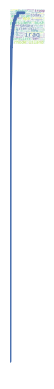

<Axes: xlabel='Samples', ylabel='Counts'>

In [93]:
whcfdist[3].plot()

In [94]:
whcpdist = nltk.ConditionalProbDist(whcfdist, nltk.ELEProbDist)

#print the most common 2 letter word
print(whcpdist[2].max())

#And its probability
print(whcpdist[2].prob(whcpdist[2].max()))

go
0.14874622554811606


In [95]:
dfreddit = dfreddit.dropna(subset=[dfreddit.columns[1]])


In [96]:
def spacy_pos(word_list):
    tags = []
    doc = nlp(word_list.lower())
    for w in doc:
        tags.append((w.text, w.tag_))
    return tags

In [97]:
dfreddit['normalized_tokens_POS'] = [spacy_pos(t) for t in dfreddit.iloc[:, 1]]

C:\Users\caiyu\AppData\Local\Temp\ipykernel_64584\1990006691.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfreddit['normalized_tokens_POS'] = [spacy_pos(t) for t in dfreddit.iloc[:, 1]]


In [98]:
if 'normalized_tokens_POS' in dfreddit.columns:
    redditcfdist_WordtoPOS = nltk.ConditionalFreqDist(dfreddit['normalized_tokens_POS'].sum())
    list(redditcfdist_WordtoPOS.items())[:10]
else:
    print("The 'normalized_tokens_POS' column does not exist in the DataFrame.")

In [99]:
if 'normalized_tokens_POS' in dfreddit.columns:
    redditcfdist_POStoWord = nltk.ConditionalFreqDist((p, w) for w, p in dfreddit['normalized_tokens_POS'].sum())
else:
    print("The 'normalized_tokens_POS' column does not exist in the DataFrame.")

In [100]:
redditcfdist_POStoWord['JJ']

FreqDist({'other': 2049, 'new': 1000, 'few': 1000, 'good': 998, 'high': 950, 'first': 900, 'same': 849, 'many': 848, 'milky': 750, 'big': 749, ...})

In [101]:
redditcfdist_POStoWord['NN'].most_common(5)

[('space', 2798),
 ('https', 2750),
 ('time', 2599),
 ('http', 2299),
 ('way', 1896)]

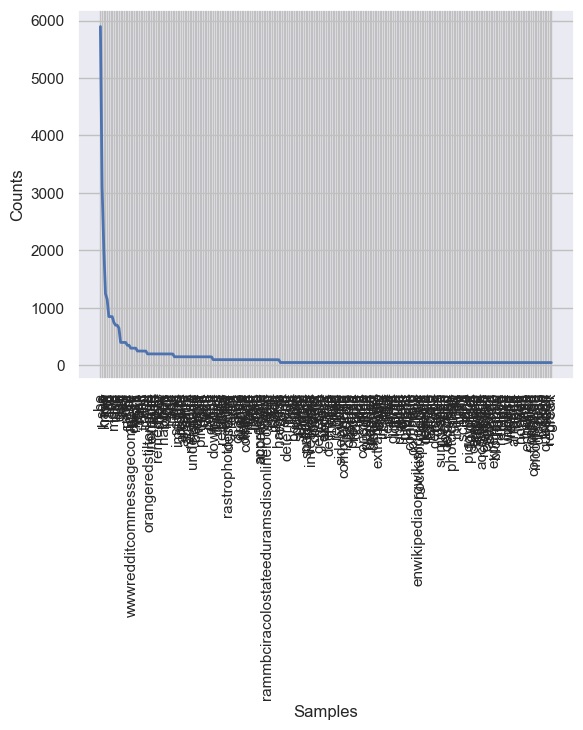

<Axes: xlabel='Samples', ylabel='Counts'>

In [102]:
redditcfdist_POStoWord['VB'].plot()

In [103]:
redditcfdist_POStoWord = nltk.ConditionalProbDist(redditcfdist_POStoWord, nltk.ELEProbDist)

#print the most common nouns
print(redditcfdist_POStoWord['NN'].max())

#And its probability
print(redditcfdist_POStoWord['NN'].prob(redditcfdist_POStoWord['NN'].max()))

space
0.016684502818509455


In [104]:
wc = wordcloud.WordCloud(background_color="white", max_words=500, width= 1000, height = 1000, mode ='RGBA', scale=.5).generate(' '.join(dfreddit['normalized_tokens'].sum()))
plt.imshow(wc)
plt.axis("off")
plt.savefig("space_word_cloud.pdf", format = 'pdf')

### Based on the POS tagging and frequency analysis of a Reddit corpus related to space, the distribution of words and their associated parts of speech indicates a strong focus on space-related content, with frequent nouns like 'space', 'earth', and 'moon' alongside adjectives like 'intelligent' and 'insignificant' paired with 'life'. This suggests the corpus is rich with discussions about space exploration, celestial bodies.

## Davies Corpora

Now that we have our basic cleaning down, we can arrange our Davies Corpora. Let us try this with the movies corpora we have already loaded.

We'll use a smaller corpus of a 1000 movies for this demonstration.

In [105]:
zfile = zipfile.ZipFile(corpus_name + "/sources_movies.zip")
source = []

In [106]:
for file in zfile.namelist():
    with zfile.open(file) as f:
        for line in f:
            source.append(line)

In [107]:
source[0:20]

[b'textID\tfileID\t#words\tgenre\tyear\tlanguage(s)\tcountry\timdb\ttitle\r\n',
 b'-----\t-----\t-----\t-----\t-----\t-----\t-----\t-----\t-----\r\n',
 b'\r\n',
 b'290635\t3547424\t4722\tShort, Musical\t1930\tUK\tEnglish\t0290635\tGoodbye to All That\r\n',
 b'21165\t6332374\t10220\tCrime, Mystery, Thriller\t1930\tUK\tEnglish\t0021165\tMurder!\r\n',
 b'21191\t6013789\t5281\tDrama, Romance\t1930\tUSA\tEnglish\t0021191\tA Notorious Affair\r\n',
 b'20620\t3660608\t6724\tBiography, Drama, History\t1930\tUSA\tEnglish\t0020620\tAbraham Lincoln\r\n',
 b'20629\t60053\t9552\tDrama, War\t1930\tUSA\tEnglish, French, German, Latin\t0020629\tAll Quiet on the Western Front\r\n',
 b'20640\t6850720\t13862\tComedy, Musical\t1930\tUSA\tEnglish\t0020640\tAnimal Crackers\r\n',
 b'20641\t176501\t11140\tDrama, Romance\t1930\tUSA\tEnglish\t0020641\tAnna Christie\r\n',
 b'20643\t3603861\t1748\tComedy, Short\t1930\tUSA\tEnglish\t0020643\tAnother Fine Mess\r\n',
 b'20670\t4159455\t6966\tComedy, Musical\t1930\tUS

It looks dirty because the file is encoded as bytes, but we can certainly see the information there. The file id is also present in the original raw text data: as the first "word". Look back at the normalized/tokenized words to confirm that. We're going to use this to create a dataframe with: Fileid, movie name, genre, year, and country.

It is advised that you run a similar check of the source file before you do other extraction.

First, let us create a dictionary mapping file-id to all the text. Each movie will be mapped to a list of the tokenized words.

In this example, I only use it to load 100 movies. You can comment this out or increase/decrease the number as you see fit.

Note that in the following cells, we make use of the `lucem_illud` package's `word_tokenize` function. You can see that function on line 70 of [processing.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/processing.py), and we provide the code here for transparency. Since we put this folder in our helper package, you won't need to define this function every time you want to use it; you just `import lucem_illud`!

In [108]:
# processing.py calls a spacy model called "en" (and sometimes called "en_core_web_sm") so we load that first.
try:
    nlp = spacy.load("en")
except OSError:
    nlp = spacy.load("en_core_web_sm")


#Here is the function from lucem_illud/lucem_illud/processing.py
def word_tokenize(word_list, model=nlp, MAX_LEN=1500000):

    tokenized = []
    if type(word_list) == list and len(word_list) == 1:
        word_list = word_list[0]

    if type(word_list) == list:
        word_list = ' '.join([str(elem) for elem in word_list])
    # since we're only tokenizing, I remove RAM intensive operations and increase max text size

    model.max_length = MAX_LEN
    doc = model(word_list, disable=["parser", "tagger", "ner"])

    for token in doc:
        if not token.is_punct and len(token.text.strip()) > 0:
            tokenized.append(token.text)
    return tokenized

In [109]:
movie_texts = {}

In [110]:
for files in movie_raw:
    if len(movie_texts) > 100:
        break
    movies = clean_raw_text(movie_raw[files][1:])
    for movie in movies:
        # We can run the following line of code with or without `lucem_illud.`, using the package or our code 2 cells above.
        txts = lucem_illud.word_tokenize(movie)
        try:
            movie_texts[txts[0][2:]] = txts[1:]
        except IndexError:
            continue

In [111]:
import pandas as pd

In [112]:
movie_df = pd.DataFrame(columns=["Movie Name", "Genre", "Year", "Country", "Tokenized Texts"])

In [113]:
for movie in source[3:]:
    try:
        tid, fileid, total_words, genre, year, lang, country, imdb, title = movie.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    try:
        movie_df.loc[fileid.strip()] = [title.strip(), genre.strip(), year.strip(), country.strip(), movie_texts[fileid.strip()]]
    except KeyError:
        continue

In [114]:
movie_df.head()

,Movie Name,Genre,Year,Country,Tokenized Texts
3435788,Born Reckless,"Crime, Drama, Film-Noir",1930,"English, Italian, French","[Louis, Louis, Beretti, Shh, Put, that, out, y..."
6880640,Dishonored,"Drama, Romance, War",1931,English,"[I, thought, I, smelled, gas, That, 's, three,..."
5482259,Indiscreet,"Comedy, Drama, Musical",1931,English,"[Subtitles, Lu, s, Filipe, Bernardes, Wait, Yo..."
5192597,The Stolen Jools,"Comedy, Short",1931,English,"[Subtitles, Lu, s, Filipe, Bernardes, Hello, W..."
3982760,College Humor,Comedy,1933,English,"[Play, ball, Although, the, game, seems, uphil..."


# Part-of-Speech (POS) tagging

In POS tagging, we classify each word by its semantic role in a sentence. We will be using the in-built spaCy pos-tagging.

https://spacy.io/usage/linguistic-features

|#. |Tag |Description |
|---|----|------------|
|1.	|CC	|Coordinating conjunction
|2.	|CD	|Cardinal number
|3.	|DT	|Determiner
|4.	|EX	|Existential there
|5.	|FW	|Foreign word
|6.	|IN	|Preposition or subordinating conjunction
|7.	|JJ	|Adjective
|8.	|JJR|	Adjective, comparative
|9.	|JJS|	Adjective, superlative
|10.|	LS	|List item marker
|11.|	MD	|Modal
|12.|	NN	|Noun, singular or mass
|13.|	NNS	|Noun, plural
|14.|	NNP	|Proper noun, singular
|15.|	NNPS|	Proper noun, plural
|16.|	PDT	|Predeterminer
|17.|	POS	|Possessive ending
|18.|	PRP	|Personal pronoun
|19.|	PRP\$|	Possessive pronoun
|20.|	RB	|Adverb
|21.|	RBR	|Adverb, comparative
|22.|	RBS	|Adverb, superlative
|23.|	RP	|Particle
|24.|	SYM	|Symbol
|25.|	TO	|to
|26.|	UH	|Interjection
|27.|	VB	|Verb, base form
|28.|	VBD	|Verb, past tense
|29.|	VBG	|Verb, gerund or present participle
|30.|	VBN	|Verb, past participle
|31.|	VBP	|Verb, non-3rd person singular present
|32.|	VBZ	|Verb, 3rd person singular present
|33.|	WDT	|Wh-determiner
|34.|	WP	|Wh-pronoun
|35.|	WP$	|Possessive wh-pronoun
|36.|	WRB	|Wh-adverb

spaCy pos-tags word as we run it through the english language model. A small example:

In [115]:
sent = nlp(u"Tom went to IKEA to get some of those delicious Swedish meatballs.")


In [116]:
for token in sent:
    print(token.text, token.pos_, token.tag_)

Tom PROPN NNP
went VERB VBD
to ADP IN
IKEA NOUN NN
to PART TO
get VERB VB
some PRON DT
of ADP IN
those DET DT
delicious ADJ JJ
Swedish ADJ JJ
meatballs NOUN NNS
. PUNCT .


This looks quite good. Now we will try POS tagging with a somewhat larger corpus. We consider a few of the top posts from the reddit data we used last week.

In [117]:
redditDF = pandas.read_csv('./data/reddit.csv')


Grabbing the 10 highest scoring posts and tokenizing the sentences. Once again, notice that we aren't going to do any kind of stemming this week (although *semantic* normalization may be performed where we translate synonyms into the same focal word). Here, we will use sentences tokenized by spaCy. Like before, these methods can also be found in `lucem_illud`.



In [118]:
def sent_tokenize(word_list):
    doc = nlp(word_list)
    sentences = [sent.text.strip() for sent in doc.sents]
    return sentences

In [119]:
redditTopScores = redditDF.sort_values('score')[-10:]
redditTopScores['sentences'] = redditTopScores['text'].apply(lambda x: [word_tokenize(s) for s in sent_tokenize(x)])
redditTopScores.index = range(len(redditTopScores) - 1, -1,-1) #Reindex to make things nice in the future
redditTopScores

c:\Users\caiyu\AppData\Local\Programs\Python\Python311\Lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


,Unnamed: 0,author,over_18,score,subreddit,text,title,url,sentences
9,8,brenkelieshere,False,9448,Tales From Tech Support,"Last year, Help Desk got a call from a user co...",How to fix a laptop that won't boot in under a...,https://www.reddit.com/r/talesfromtechsupport/...,"[[Last, year, Help, Desk, got, a, call, from, ..."
8,7,Bombadils,False,10528,Tales From Tech Support,First post in quite some time! I work at a loc...,"OK, now the password is 'D35p41r'",https://www.reddit.com/r/talesfromtechsupport/...,"[[First, post, in, quite, some, time], [I, wor..."
7,1200,whenlifegivesyoushit,False,11003,Relationships,[Original Post](https://www.reddit.com/r/relat...,[UPDATE]My [26 F] with my husband [29 M] 1 yea...,https://www.reddit.com/r/relationships/comment...,"[[Original, Post](https://www.reddit.com, r, r..."
6,6,sfsdfd,False,11295,Tales From Tech Support,I witnessed this astounding IT meltdown around...,"Company-wide email + 30,000 employees + auto-r...",https://www.reddit.com/r/talesfromtechsupport/...,"[[I, witnessed, this, astounding, IT, meltdown..."
5,5,Raitaro,False,12372,Tales From Tech Support,I work Helpdesk for a retail store chain in th...,I'm pretty sure I knocked a user out from near...,https://www.reddit.com/r/talesfromtechsupport/...,"[[I, work, Helpdesk, for, a, retail, store, ch..."
4,4,goldie-gold,False,12650,Tales From Tech Support,"This just happened... So, I had a laptop syst...",Engineer is doing drugs!! No. No they aren't.,https://www.reddit.com/r/talesfromtechsupport/...,"[[This, just, happened], [So, I, had, a, lapto..."
3,3,TheDroolinFool,False,13152,Tales From Tech Support,Another tale from the out of hours IT desk... ...,"""I need you to fix Google Bing immediately!""",https://www.reddit.com/r/talesfromtechsupport/...,"[[Another, tale, from, the, out, of, hours, IT..."
2,2,Clickity_clickity,False,13404,Tales From Tech Support,[Part 1](http://www.reddit.com/r/talesfromtech...,"Jack, the Worst End User, Part 4",https://www.reddit.com/r/talesfromtechsupport/...,"[[Part, 1](http://www.reddit.com, r, talesfrom..."
1,1,SECGaz,False,13724,Tales From Tech Support,"> $Me - Hello, IT. > $Usr - Hi, I am still ...","Hi, I am still off sick but I am not.",https://www.reddit.com/r/talesfromtechsupport/...,"[[>, $, Me, Hello, IT], [>, $, Usr, Hi, I, am,..."
0,0,guitarsdontdance,False,14089,Tales From Tech Support,So my story starts on what was a normal day ta...,"""Don't bother sending a tech, I'll be dead by ...",https://www.reddit.com/r/talesfromtechsupport/...,"[[So, my, story, starts, on, what, was, a, nor..."


In [120]:
def tag_sents_pos(sentences):
    """
    function which replicates NLTK pos tagging on sentences.
    """
    new_sents = []
    for sentence in sentences:
        new_sent = ' '.join(sentence)
        new_sents.append(new_sent)
    final_string = ' '.join(new_sents)
    doc = nlp(final_string)

    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for token in sent:
            pos_sent.append((token.text, token.tag_))
        pos_sents.append(pos_sent)

    return pos_sents

In [121]:
redditTopScores['POS_sents'] = redditTopScores['sentences'].apply(lambda x: tag_sents_pos(x))

In [122]:
redditTopScores['POS_sents']

9    [[(Last, JJ), (year, NN), (Help, NNP), (Desk, ...
8    [[(First, JJ), (post, NN), (in, IN), (quite, P...
7    [[(Original, JJ), (Post](https://www.reddit.co...
6    [[(I, PRP), (witnessed, VBD), (this, DT), (ast...
5    [[(I, PRP), (work, VBP), (Helpdesk, NNP), (for...
4    [[(This, DT), (just, RB), (happened, VBD), (So...
3    [[(Another, DT), (tale, NN), (from, IN), (the,...
2    [[(Part, NN), (1](http://www.reddit.com, NNP),...
1    [[(>, XX), ($, $), (Me, PRP)], [(Hello, UH), (...
0    [[(So, RB), (my, PRP$), (story, NN), (starts, ...
Name: POS_sents, dtype: object

And count the number of `NN` (nouns)

In [123]:
countTarget = 'NN'
targetCounts = {}
for entry in redditTopScores['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:20]

[('password', 22),
 ('time', 14),
 ('computer', 13),
 ('lot', 12),
 ('life', 11),
 ('email', 11),
 ('system', 10),
 ('laptop', 9),
 ('message', 9),
 ('day', 9),
 ('auto', 9),
 ('call', 8),
 ('office', 8),
 ('part', 8),
 ('today', 8),
 ('story', 8),
 ('job', 7),
 ('something', 7),
 ('problem', 7),
 ('drawer', 7)]

What about the adjectives that modify the word, "computer"?

In [124]:
NTarget = 'JJ'
Word = 'computer'
NResults = set()
for entry in redditTopScores['POS_sents']:
    for sentence in entry:
        for (ent1, kind1),(ent2,kind2) in zip(sentence[:-1], sentence[1:]):
            if (kind1,ent2.lower())==(NTarget,Word):
                NResults.add(ent1)
            else:
                continue

print(NResults)

{'own', 'unrestricted'}


## <font color="red">Exercise 3</font>

<font color="red">In the cells immediately following, perform POS tagging on a meaningful (but modest) subset of a corpus associated with your final project. Examine the list of words associated with at least three different parts of speech. Consider conditional associations (e.g., adjectives associated with nouns or adverbs with verbs of interest). What do these distributions suggest about your corpus?

In [125]:
def tag_sents_pos(sentences, nlp):
    """
    Function which replicates NLTK pos tagging on sentences, modified to avoid single letters as tokens.
    """
    # Joining tokens into sentences and sentences into one string for NLP processing
    final_string = ' '.join([' '.join(sentence) for sentence in sentences])
    doc = nlp(final_string)

    # Part-of-speech tagging
    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for token in sent:
            # Check if the token is a single character that is not 'a' or 'I'
            if len(token.text) == 1 and token.text.lower() not in ['a', 'i']:
                # Skip single characters that are not valid words
                continue
            # Append the token and its tag to the list
            pos_sent.append((token.text, token.tag_))
        pos_sents.append(pos_sent)

    return pos_sents

In [126]:
def tag_sents_pos(sentences, nlp):
    """
    Function which replicates NLTK pos tagging on sentences, modified to avoid single letters as tokens.
    """
    pos_sents = []
    for sentence in sentences:
        # Process the sentence using the nlp model
        doc = nlp(' '.join(sentence))
        pos_sent = [(token.text, token.tag_) for token in doc if not token.is_space]
        pos_sents.append(pos_sent)
    return pos_sents

In [127]:
def sent_tokenize(word_list):
    doc = nlp(word_list)
    sentences = [sent.text.strip() for sent in doc.sents]
    return sentences

In [128]:
dfreddit['sentences'] =dfreddit.iloc[:, 1].apply(lambda x: [word_tokenize(s) for s in sent_tokenize(x)])
dfreddit.index = range(len(dfreddit) - 1, -1,-1) #Reindex to make things nice in the future
dfreddit

c:\Users\caiyu\AppData\Local\Programs\Python\Python311\Lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


C:\Users\caiyu\AppData\Local\Temp\ipykernel_64584\1868266906.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfreddit['sentences'] =dfreddit.iloc[:, 1].apply(lambda x: [word_tokenize(s) for s in sent_tokenize(x)])


,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,tokenized_text,normalized_tokens,normalized_tokens_count,normalized_tokens_POS,sentences
18379,0,i do nt know what it s worth so let me call a ...,d02scrr,space,learning,1.455680e+09,RemoteViewingTrainee,1.0,0.0,187,13492,0.0,"[i, do, nt, know, what, it, s, worth, so, let,...","[not, know, s, worth, let, buddy, s, expert, n...",10,"[(i, PRP), (do, VBP), (nt, RB), (know, VB), (w...","[[i, do, nt, know, what, it, s, worth, so, let..."
18378,2,fyi the isolated spike in astronaut hiring by...,d01s74n,space,learning,1.455622e+09,KubrickIsMyCopilot,2.0,0.0,30544,74640,0.0,"[fyi, the, isolated, spike, in, astronaut, hir...","[fyi, isolated, spike, astronaut, hire, china,...",18,"[(fyi, UH), ( , _SP), (the, DT), (isolated, JJ...","[[fyi, the, isolated, spike, in, astronaut, hi..."
18377,6,48 not 63 d,d02f2c4,space,learning,1.455660e+09,bytewright,6.0,0.0,120,106,0.0,"[48, not, 63, d]",[d],1,"[(48, CD), (not, RB), (63, CD), ( , _SP), (d,...","[[48, not, 63, d]]"
18376,7,gifv link https iimgurcom3luraemgifv fa...,d02azo2,space,learning,1.455654e+09,gifv-bot,1.0,0.0,1,52737,1.0,"[gifv, link, https, iimgurcom3luraemgifv, faq,...","[gifv, link, https, iimgurcom3luraemgifv, faq,...",7,"[( , _SP), (gifv, NNP), (link, VB), ( , _SP),...","[[gifv, link, https, iimgurcom3luraemgifv, faq..."
18375,8,btw how long will the travel take 23 years,d029x07,space,learning,1.455653e+09,Jeffy29,2.0,0.0,1050,64485,1.0,"[btw, how, long, will, the, travel, take, 23, ...","[btw, long, travel, year]",4,"[(btw, RB), (how, WRB), (long, RB), (will, MD)...","[[btw, how, long, will, the, travel, take, 23,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,22720,a great site about space launch vehicles is th...,d00yiiw,space,learning,1.455564e+09,KSPReptile,1.0,0.0,4216,18074,0.0,"[a, great, site, about, space, launch, vehicle...","[great, site, space, launch, vehicle, http, ww...",19,"[(a, DT), (great, JJ), (site, NN), (about, IN)...","[[a, great, site, about, space, launch, vehicl..."
3,22721,this is really great i love lineups like this ...,d00zrt4,space,learning,1.455566e+09,NecroBones,1.0,0.0,4273,1116,1.0,"[this, is, really, great, i, love, lineups, li...","[great, love, lineup, like, great, poster]",6,"[(this, DT), (is, VBZ), (really, RB), (great, ...","[[this, is, really, great], [i, love, lineups,..."
2,22722,it s crazy how close in payload sls and falcon...,d00evrb,space,learning,1.455518e+09,TessMunstersRightArm,1.0,0.0,390,1940,0.0,"[it, s, crazy, how, close, in, payload, sls, a...","[s, crazy, close, payload, sls, falcon, heavy,...",10,"[(it, PRP), (s, VBZ), (crazy, JJ), (how, WRB),...","[[it, s, crazy, how, close, in, payload, sls, ..."
1,22723,deleted,d00l8et,space,learning,1.455541e+09,[deleted],27.0,0.0,0,0,NaN,[deleted],[delete],1,"[( , _SP), (deleted, VBN)]",[[deleted]]


In [130]:
dfreddit['POS_sents'] = dfreddit['tokenized_text'].apply(lambda x: tag_sents_pos(x, nlp))

KeyboardInterrupt: 

In [ ]:
dfreddit['POS_sents']

18379    [(i, PRP), (do, VBP), (nt, RB), (know, VB), (w...
18378    [(fyi, UH), ( , _SP), (the, DT), (isolated, JJ...
18377    [(48, CD), (not, RB), (63, CD), (  , _SP), (d,...
18376    [( , _SP), (gifv, NNP), (link, VB), (  , _SP),...
18375    [(btw, RB), (how, WRB), (long, RB), (will, MD)...
                               ...                        
4        [(a, DT), (great, JJ), (site, NN), (about, IN)...
3        [(this, DT), (is, VBZ), (really, RB), (great, ...
2        [(it, PRP), (s, VBZ), (crazy, JJ), (how, WRB),...
1                               [( , _SP), (deleted, VBN)]
0                               [( , _SP), (deleted, VBN)]
Name: POS_sents, Length: 18380, dtype: object

In [ ]:
for entry in dfreddit['POS_sents'][:10]:
    print(entry)

[('i', 'PRP'), ('do', 'VBP'), ('nt', 'RB'), ('know', 'VB'), ('what', 'WP'), ('it', 'PRP'), ('s', 'VBZ'), ('worth', 'JJ'), ('so', 'RB'), ('let', 'VB'), ('me', 'PRP'), ('call', 'VB'), ('a', 'DT'), ('buddy', 'NN'), ('who', 'WP'), ('s', 'VBZ'), ('an', 'DT'), ('expert', 'NN'), ('in', 'IN'), ('nasa', 'NNP'), ('patches', 'NNS')]
[('fyi', 'UH'), (' ', '_SP'), ('the', 'DT'), ('isolated', 'JJ'), ('spike', 'NN'), ('in', 'IN'), ('astronaut', 'NN'), ('hiring', 'VBG'), ('by', 'IN'), ('china', 'NNP'), ('in', 'IN'), ('1971', 'CD'), ('was', 'VBD'), ('due', 'JJ'), ('to', 'IN'), ('an', 'DT'), ('abortive', 'JJ'), ('manned', 'VBN'), ('spaceflight', 'NN'), ('program', 'NN'), ('called', 'VBN'), (' ', '_SP'), ('shuguang', 'NNP'), ('  ', '_SP'), ('https', 'NNP'), (' ', '_SP'), ('enwikipediaorgwikishuguang', 'NN'), ('_', 'NNP'), (' ', '_SP'), ('28spacecraft', 'CD'), (' ', '_SP'), ('29', 'CD'), (' ', '_SP'), ('that', 'WDT'), ('never', 'RB'), ('flew', 'VBD'), ('and', 'CC'), ('was', 'VBD'), ('cancelled', 'VBN'), (

In [ ]:
recountTarget = 'NN'  # Use 'NOUN' if using spaCy
retargetCounts = {}

print("Starting to count nouns...")

for entry in dfreddit['POS_sents']:
    for token, tag in entry:
        if tag == recountTarget:
            retargetCounts[token] = retargetCounts.get(token, 0) + 1

# Print the resulting counts
print("Noun counts:", retargetCounts)

resortedTargets = sorted(retargetCounts.items(), key=lambda x: x[1], reverse=True)
print("Top 20 nouns:", resortedTargets[:20])

Starting to count nouns...
Noun counts: {'buddy': 50, 'expert': 100, 'spike': 50, 'astronaut': 150, 'spaceflight': 150, 'program': 300, 'enwikipediaorgwikishuguang': 50, 'year': 550, 'd': 100, 'https': 2750, 'wwwredditcomrlivvenwikigifvbot': 50, 'travel': 400, 'breathing': 50, 'video': 400, 'person': 250, 'reaction': 100, 'announcer': 50, 'meth': 50, 'head': 299, 'shot': 396, 'pollution': 549, 'bs': 50, 'op': 300, 'science': 448, 'arandomkerbonaut': 50, 'album': 150, 'download': 100, 'page': 50, 'pr': 50, 'lander': 250, 'camera': 850, 'post': 450, 'sub': 100, 'picture': 999, 'imagination': 50, 'sense': 350, 'wonder': 50, 'society': 50, 'photo': 748, 'kit': 50, 'lens': 299, 'side': 500, 'moon': 1100, 'earth': 1499, 'field': 100, 'kind': 549, 'stuff': 400, 'infrared': 50, 'jwst': 100, 'integration': 50, 'time': 2599, 'radio': 450, 'street': 250, 'question': 850, 'part': 750, 'bang': 250, 'theory': 450, 'anything': 947, 'fact': 500, 'evidence': 150, 'universe': 897, 'circle': 300, 'slice'

In [ ]:
NTarget = 'JJ'
Word = 'future'
NResults = set()

for entry in dfreddit['POS_sents']:
    # Iterate over the sentence and check pairs of (current, next) tokens
    for i in range(len(entry) - 1):
        ent1, kind1 = entry[i]     # Current token and its tag
        ent2, kind2 = entry[i + 1] # Next token and its tag
        if kind1 == NTarget and ent2.lower() == Word:
            NResults.add(ent1)

print(NResults)

{'immediate'}


In [ ]:
NTarget = 'JJ'
Word = 'work'
NResults = set()

for entry in dfreddit['POS_sents']:
    # Iterate over the sentence and check pairs of (current, next) tokens
    for i in range(len(entry) - 1):
        ent1, kind1 = entry[i]     # Current token and its tag
        ent2, kind2 = entry[i + 1] # Next token and its tag
        if kind1 == NTarget and ent2.lower() == Word:
            NResults.add(ent1)

print(NResults)

{'previous', 'nice'}


In [ ]:
NTarget = 'JJ'
Word = 'life'
NResults = set()

for entry in dfreddit['POS_sents']:
    # Iterate over the sentence and check pairs of (current, next) tokens
    for i in range(len(entry) - 1):
        ent1, kind1 = entry[i]     # Current token and its tag
        ent2, kind2 = entry[i + 1] # Next token and its tag
        if kind1 == NTarget and ent2.lower() == Word:
            NResults.add(ent1)

print(NResults)

{'intelligent', 'insignificant', 'busy', 'young', 'everyday'}


### The corpus, learning-space, may have come from a discussion board on a particular spatial topic on reddit.The conditional association analysis reveals adjective-noun pairings. The adjective 'immediate' is associated with 'future', 'previous' and 'nice' with 'work', and 'intelligent', 'insignificant', 'busy', 'young', and 'everyday' with 'life'. The use of 'immediate future' may indicate discussions around imminent events or expectations in the field of space or technology.   'Previous work' and 'nice work' reflect acknowledgment or discussion of past achievements or contributions.

# Collocations

As illustrated above, we might want to find significant bigrams (two-word phrases), trigrams (three-word phrases), n-grams (*n*-word phrases) or skip-grams (noncontinguous 'phrases' with skip-length *n*).

We will begin with the [`nltk.collocations.BigramCollocationFinder`](http://www.nltk.org/api/nltk.html?highlight=bigramcollocationfinder#nltk.collocations.BigramCollocationFinder) class, which can be given raw lists of strings with the `from_words()` method. By default it only looks at continuous bigrams but there is an option (`window_size`) to allow skip-grams.

In [229]:
whBigrams = nltk.collocations.BigramCollocationFinder.from_words(whReleases['normalized_tokens'].sum())
print("There are {} bigrams in the finder".format(whBigrams.N))

KeyError: 'normalized_tokens'

To compare the bigrams we need to tell nltk what our score function is. Initially, we will look at the raw counts.

In [ ]:
def bigramScoring(count, wordsTuple, total):
    return count

print(whBigrams.nbest(bigramScoring, 10))

[('president', 'bush'), ('rhode', 'island'), ('sheldon', 'whitehouse'), ('stem', 'cell'), ('whitehouse', 'd'), ('d', 'r.i'), ('bush', 'administration'), ('u.s', 'senator'), ('whitehouse', 'say'), ('american', 'people')]


One note about how `BigramCollocationFinder` works. It doesn't use the strings internally.

In [ ]:
birgramScores = []

def bigramPrinting(count, wordsTuple, total):
    global birgramScores
    birgramScores.append("The first word is:  {}, The second word is: {}".format(*wordsTuple))
    #Returns None so all the tuples are considered to have the same rank

whBigrams.nbest(bigramPrinting, 10)
print('\n'.join(birgramScores[:10]))

The first word is:  28, The second word is: 31
The first word is:  20, The second word is: 17
The first word is:  12, The second word is: 12
The first word is:  12, The second word is: 40
The first word is:  40, The second word is: 17
The first word is:  17, The second word is: 10
The first word is:  40, The second word is: 17
The first word is:  13, The second word is: 13
The first word is:  31, The second word is: 11
The first word is:  9, The second word is: 24


The words are each given numeric IDs and there is a dictionary that maps the IDs to the words they represent. This is a common performance optimization.

Two words can appear together by chance. Recall from  Manning and Schütze's textbook that a t-value can be computed for each bigram to see how significant the association is. You may also want to try computing the $\chi^2$, likelihood ratio, and pointwise mutual information statistics.

In [ ]:
bigram_measures = nltk.collocations.BigramAssocMeasures()
whBigrams.score_ngrams(bigram_measures.likelihood_ratio)[:40]
# other options include student_t, chi_sq, likelihood_ratio, pmi

[(('rhode', 'island'), 178.42791632631025),
 (('stem', 'cell'), 146.27449459815534),
 (('president', 'bush'), 126.23062149808423),
 (('sheldon', 'whitehouse'), 97.40535043376386),
 (('d', 'r.i'), 84.89634183337617),
 (('united', 'states'), 81.47339960284599),
 (('whitehouse', 'd'), 57.74744623651276),
 (('u.s', 'senator'), 57.03786703770191),
 (('senator', 'sheldon'), 46.93608358543005),
 (('jack', 'reed'), 46.47304595760241),
 (('american', 'people'), 46.35726044599012),
 (('bush', 'administration'), 45.4509557751863),
 (('honor', 'society'), 44.900172381728815),
 (('bring', 'troop'), 43.07951375003984),
 (('cell', 'research'), 41.08298559892974),
 (('d', 'ri'), 39.013185331609264),
 (('potential', 'closing'), 38.17005571163625),
 (('youth', 'program'), 38.17005571163625),
 (('troop', 'home'), 36.666015832295386),
 (('come', 'home'), 36.52029777577777),
 (('epw', 'committee'), 34.315160571201105),
 (('whitehouse', 'say'), 33.09869922194955),
 (('budget', 'resolution'), 32.086787845859

There are a few other available measures

In [ ]:
[s for s in dir(bigram_measures) if s[0] != '_']

['chi_sq',
 'dice',
 'fisher',
 'jaccard',
 'likelihood_ratio',
 'mi_like',
 'phi_sq',
 'pmi',
 'poisson_stirling',
 'raw_freq',
 'student_t']

We can also look at trigrams

In [ ]:
trigram_measures = nltk.collocations.TrigramAssocMeasures()
whTrigrams = nltk.collocations.TrigramCollocationFinder.from_words(whReleases['normalized_tokens'].sum())
whTrigrams.score_ngrams(trigram_measures.student_t)[:20]

[(('sheldon', 'whitehouse', 'd'), 3.1616086893217816),
 (('whitehouse', 'd', 'r.i'), 2.6450850001523705),
 (('bring', 'troop', 'home'), 2.449192549827382),
 (('senator', 'sheldon', 'whitehouse'), 2.448829313992519),
 (('stem', 'cell', 'research'), 2.235917719697493),
 (('u.s', 'senator', 'sheldon'), 2.235832851864714),
 (('senate', 'youth', 'program'), 1.7320171301402933),
 (('united', 'states', 'senator'), 1.7319807585174225),
 (('jack', 'reed', 'd'), 1.7319693830304341),
 (('new', 'direction', 'iraq'), 1.7318496410621351),
 (('rhode', 'island', 'state'), 1.731694575213188),
 (('whitehouse', 'd', 'ri'), 1.731643684876661),
 (('sen', 'sheldon', 'whitehouse'), 1.731188665397125),
 (('reconsider', 'potential', 'closing'), 1.4142080628720362),
 (('responsibility', 'security', 'governance'), 1.4142047631714012),
 (('$', 'foregone', 'surplus'), 1.4142018301041699),
 (('v.', 'epa', 'decide'), 1.4142018301041699),
 (('cell', 'enhancement', 'act'), 1.4142003635705542),
 (('select', 'committee'

Or n-grams (for any number n)

In [ ]:
Ngrams = nltk.ngrams(whReleases['normalized_tokens'].sum(), 4)
Counts = {}
for ngram in list(Ngrams):
    if ngram in Counts.keys():
        Counts[ngram] += 1
    else:
        Counts[ngram] = 1
Filtered = {}
for key in Counts.keys():
    if Counts[key] < 2:
        pass
    else:
        Filtered[key] = Counts[key]
print(Filtered)

{('sen', 'sheldon', 'whitehouse', 'd'): 2, ('sheldon', 'whitehouse', 'd', 'r.i'): 7, ('stem', 'cell', 'research', 'whitehouse'): 2, ('stem', 'cell', 'enhancement', 'act'): 2, ('begin', 'bring', 'troop', 'home'): 2, ('bring', 'troop', 'home', 'iraq'): 2, ('u.s', 'senator', 'sheldon', 'whitehouse'): 5, ('senator', 'sheldon', 'whitehouse', 'd'): 5, ('sheldon', 'whitehouse', 'd', 'ri'): 3, ('whitehouse', 'd', 'ri', 'say'): 2, ('d', 'ri', 'say', 'today'): 2, ('member', 'senate', 'select', 'committee'): 2, ('senate', 'select', 'committee', 'intelligence'): 2, ('california', 'rhode', 'island', 'state'): 2, ('u.s', 'senator', 'jack', 'reed'): 2, ('senator', 'jack', 'reed', 'd'): 2, ('jack', 'reed', 'd', 'r.i'): 2, ('reed', 'd', 'r.i', 'sheldon'): 2, ('d', 'r.i', 'sheldon', 'whitehouse'): 2, ('r.i', 'sheldon', 'whitehouse', 'd'): 2, ('iraq', 'sen', 'sheldon', 'whitehouse'): 2, ('portuguese', 'american', 'citizen', 'rhode'): 2, ('american', 'citizen', 'rhode', 'island'): 2}


Gensim is another important python text processing package which allows us to use collocations, among other cool methods (which we will explore later weeks).

In [159]:
import gensim

In [160]:
bigram = gensim.models.Phrases(whReleases['normalized_tokens'])

In [161]:
texts = [bigram[line] for line in whReleases['normalized_tokens']]

In [162]:
texts[0]

['sen',
 'whitehouse',
 'share',
 'westerly',
 'girl',
 'story',
 'push',
 'stem_cell',
 'research',
 'share',
 'story',
 'lila',
 'barber',
 'year',
 'old',
 'girl',
 'westerly',
 'sen',
 'sheldon_whitehouse',
 'd_r.i',
 'tuesday',
 'april',
 'illustrate',
 'hope',
 'stem_cell',
 'research',
 'offer',
 'speech',
 'senate',
 'floor',
 'favor',
 'legislation',
 'expand',
 'federal',
 'funding',
 'stem_cell',
 'research',
 'whitehouse',
 'meet',
 'lila',
 'week',
 'ago',
 'diagnose',
 'year',
 'ago',
 'osteosarcoma',
 'cancerous',
 'bone',
 'condition',
 'year',
 'undergo',
 'cadaver',
 'bone',
 'transplant',
 'surgery',
 'procedure',
 'save',
 'leg',
 'help',
 'remain',
 'cancer',
 'free',
 'transplanted',
 'tissue',
 'grow',
 'likely',
 'break',
 'time',
 'stem_cell',
 'research',
 'whitehouse',
 'explain',
 'vastly',
 'improve',
 'care',
 'patient',
 'like',
 'lila',
 'allow',
 'surgeon',
 'enhance',
 'transplant',
 'patient',
 'stem_cell',
 'replace',
 'lose',
 'bone',
 'cartilage',


## <font color="red">*Exercise 4*</font>

<font color="red">Construct cells immediately below this that identify statistically significant bigrams, trigrams, quadgrams, higher-order *n*grams and skipgrams. Explore whether these collocations are idiomatic and so irreducible to the semantic sum of their component words. You can do this by examination of conditional frequencies (e.g., what else is 'united' besides the 'United States'). If these phrases are idiomatic, what do they suggest about the culture of the world producing them?

<font color="red">**Stretch**: In Manning and Schütze's textbook, there Section 5.3.2 explores how to use the *t*-test to find words whose co-occurance patterns best distinguish two words. Implement that and use it to explore phrases in your corpus. For instance, you could tell what words come after "America" much more often than after "Iraq"?</font>

In [151]:
reBigrams = nltk.collocations.BigramCollocationFinder.from_words(dfreddit['normalized_tokens'].sum())
print("There are {} bigrams in the finder".format(reBigrams.N))

There are 449298 bigrams in the finder


In [152]:
def bigramScoring(count, wordsTuple, total):
    return count

print(reBigrams.nbest(bigramScoring, 10))

[('gravity', 'wave'), ('milky', 'way'), ('look', 'like'), ('black', 'hole'), ('night', 'sky'), ('southern', 'cross'), ('big', 'bang'), ('year', 'ago'), ('light', 'pollution'), ('gravitational', 'wave')]


In [153]:
rebigram_measures = nltk.collocations.BigramAssocMeasures()
reBigrams.score_ngrams(rebigram_measures.likelihood_ratio)[:40]
# other options include student_t, chi_sq, likelihood_ratio, pmi

[(('black', 'hole'), 8554.322452216562),
 (('milky', 'way'), 8449.311890217388),
 (('gravity', 'wave'), 7321.906478930157),
 (('southern', 'cross'), 6918.067385034662),
 (('big', 'bang'), 5809.210600969665),
 (('wwwyoutubecomwatch', 'v'), 5709.9832240604355),
 (('light', 'pollution'), 5432.323370382959),
 (('year', 'ago'), 5275.419971943575),
 (('night', 'sky'), 5047.940419855904),
 (('gravitational', 'wave'), 4792.026441401516),
 (('iridium', 'flare'), 4514.332765734928),
 (('ion', 'engine'), 4378.222668600294),
 (('naked', 'eye'), 3978.300185005713),
 (('amp', 'amp'), 3946.878865721502),
 (('look', 'like'), 3584.300284141324),
 (('https', 'wwwyoutubecomwatch'), 3561.1167459788326),
 (('abbreviation', 'contraction'), 3486.760669867551),
 (('acronym', 'initialism'), 3486.760669867551),
 (('contraction', 'phrase'), 3486.760669867551),
 (('initialism', 'abbreviation'), 3486.760669867551),
 (('phrase', 'expand'), 3486.760669867551),
 (('wwwdecronymxyz', 'list'), 3236.559458098457),
 (('or

In [167]:
[s for s in dir(rebigram_measures) if s[0] != '_']

['chi_sq',
 'dice',
 'fisher',
 'jaccard',
 'likelihood_ratio',
 'mi_like',
 'phi_sq',
 'pmi',
 'poisson_stirling',
 'raw_freq',
 'student_t']

In [155]:
retrigram_measures = nltk.collocations.TrigramAssocMeasures()
reTrigrams = nltk.collocations.TrigramCollocationFinder.from_words(dfreddit['normalized_tokens'].sum())
reTrigrams.score_ngrams(retrigram_measures.student_t)[:20]

[(('https', 'wwwyoutubecomwatch', 'v'), 18.708191246390925),
 (('abbreviation', 'contraction', 'phrase'), 14.142132821486495),
 (('acronym', 'initialism', 'abbreviation'), 14.142132821486495),
 (('contraction', 'phrase', 'expand'), 14.142132821486495),
 (('initialism', 'abbreviation', 'contraction'), 14.142132821486495),
 (('orangeredstiltonamp', 'subject', 'heyyouracronymbotsuck'),
  14.142131420364269),
 (('wwwdecronymxyz', 'list', 'sub'), 14.142130369522597),
 (('bot', 'write', 'php'), 14.142129493821205),
 (('utc', 'wwwdecronymxyz', 'list'), 14.142129493821205),
 (('wwwredditcommessagecompose', 'orangeredstiltonamp', 'subject'),
  14.142129318680928),
 (('feb', 'utc', 'wwwdecronymxyz'), 14.142128267839258),
 (('act', 'tell', 'orangeredstilton'), 14.142126530447694),
 (('phrase', 'expand', 'large'), 14.142125115314245),
 (('amp', 'acronym', 'initialism'), 14.142123013630904),
 (('few', 'letter', 'letter'), 14.142121437368399),
 (('thread', 'few', 'letter'), 14.142115132318377),
 (('

In [156]:
reNgrams = nltk.ngrams(dfreddit['normalized_tokens'].sum(), 4)
reCounts = {}
for ngram in list(reNgrams):
    if ngram in reCounts.keys():
        reCounts[ngram] += 1
    else:
        reCounts[ngram] = 1
reFiltered = {}
for key in reCounts.keys():
    if reCounts[key] < 2:
        pass
    else:
        reFiltered[key] = reCounts[key]
print(reFiltered)

{('not', 'know', 's', 'worth'): 50, ('know', 's', 'worth', 'let'): 50, ('s', 'worth', 'let', 'buddy'): 50, ('worth', 'let', 'buddy', 's'): 50, ('let', 'buddy', 's', 'expert'): 50, ('buddy', 's', 'expert', 'nasa'): 50, ('s', 'expert', 'nasa', 'patch'): 50, ('expert', 'nasa', 'patch', 'fyi'): 2, ('nasa', 'patch', 'fyi', 'isolated'): 2, ('patch', 'fyi', 'isolated', 'spike'): 2, ('fyi', 'isolated', 'spike', 'astronaut'): 50, ('isolated', 'spike', 'astronaut', 'hire'): 50, ('spike', 'astronaut', 'hire', 'china'): 50, ('astronaut', 'hire', 'china', 'abortive'): 50, ('hire', 'china', 'abortive', 'man'): 50, ('china', 'abortive', 'man', 'spaceflight'): 50, ('abortive', 'man', 'spaceflight', 'program'): 50, ('man', 'spaceflight', 'program', 'call'): 50, ('spaceflight', 'program', 'call', 'shuguang'): 50, ('program', 'call', 'shuguang', 'https'): 50, ('call', 'shuguang', 'https', 'enwikipediaorgwikishuguang'): 50, ('shuguang', 'https', 'enwikipediaorgwikishuguang', '28spacecraft'): 50, ('https',

In [164]:
rebigram = gensim.models.Phrases(dfreddit['normalized_tokens'])

In [165]:
retexts = [rebigram[line] for line in dfreddit['normalized_tokens']]

In [166]:
retexts[0]

['not', 'know', 's', 'worth', 'let_buddy', 's', 'expert', 'nasa', 'patch']

### The presence of bigrams such as ('black', 'hole'), ('milky', 'way'), ('gravity', 'wave'), and ('southern', 'cross') at the top of the statistical significance list suggests that discussions within the corpus are heavily focused on celestial phenomena and astrophysics. This implies that the community generating the text has a strong interest in or is engaged in learning about space and related scientific phenomena. The frequent mention of 'black holes' and 'milky way' indicates a specific interest in deep space objects and fundamental cosmic structures. Meanwhile, 'gravity waves' likely reflects conversations around cutting-edge physics,

###  trigram results such as ('https', 'wwwyoutubecomwatch', 'v') likely comes from URLs shared within the Reddit dataset, specifically YouTube video links,sugesst that it's mayeasier to share video links during discussions.Some unrelated or "strange" trigrams in a dataset focused on space probably because phrases involving 'bot', 'subject', or similar terms could be referencing automated systems or bots within the community, either as part of the forum functionality or as a topic of discussion themselves.

# Named-Entity Recognition

Named Entity Recognition (NER) is also a classification task, which identifies named objects.
Like every other part of the pipeline, spaCy also tags words with their tagged entity (https://spacy.io/api/entityrecognizer). You can see the full capacity of what spaCy does by checking out: https://spacy.io/usage/linguistic-features.

For training the identification of such entities, spaCy uses a deep learning model.

Let's try it on a basic sentence:

In [ ]:
sent = nlp(u"Tom went to IKEA to get some of those delicious Swedish meatballs.")

In [ ]:
for token in sent:
    print(token.text, token.ent_type_)

Tom PERSON
went 
to 
IKEA 
to 
get 
some 
of 
those 
delicious 
Swedish NORP
meatballs 
. 


For only finding ents-

In [ ]:
for ent in sent.ents:
    print(ent.text, ent.label_)

Tom PERSON
Swedish NORP


In [ ]:
def tag_sents_ner(sentences):
    """
    function which replicates NLTK ner tagging on sentences.
    """
    new_sents = []
    for sentence in sentences:
        new_sent = ' '.join(sentence)
        new_sents.append(new_sent)
    final_string = ' '.join(new_sents)
    doc = nlp(final_string)

    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for ent in sent.ents:
            pos_sent.append((ent.text, ent.label_))
        pos_sents.append(pos_sent)

    return pos_sents

We can also run NER over our entire corpus:

In [ ]:
redditTopScores['classified_sents'] = redditTopScores['sentences'].apply(lambda x: tag_sents_ner(x))

In [ ]:
redditTopScores['classified_sents']

9    [[(Last year, DATE), (Help Desk, PERSON)], [],...
8    [[(First, ORDINAL)], [(today, DATE)], [(Citrix...
7    [[], [(about a month, DATE), (a few days ago, ...
6    [[(all-employees@org.edu, NORP), (30,000, CARD...
5    [[(Helpdesk, ORG), (UK, GPE)], [(one, CARDINAL...
4    [[], [(Engineer, ORG), (All good 10 minutes la...
3    [[(the out of hours, TIME), (Desk Caller, PERS...
2    [[(1](http://www.reddit.com, CARDINAL), (comme...
1    [[], [], [(Usr, PERSON)], [], [], [], [], [(Us...
0    [[], [(over 45 minutes, TIME), (Smith, PERSON)...
Name: classified_sents, dtype: object

Find the most common entities (which are, of course, boring):

In [ ]:
entityCounts = {}
for entry in redditTopScores['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if ent in entityCounts:
                entityCounts[ent] += 1
            else:
                entityCounts[ent] = 1
sortedEntities = sorted(entityCounts.items(), key = lambda x: x[1], reverse = True)
sortedEntities[:10]

[('Usr', 27),
 ('Jack', 14),
 ('today', 8),
 ('one', 6),
 ('Google Bing', 5),
 ('Boss', 5),
 ('Smith', 5),
 ('9', 4),
 ('HRsystem', 4),
 ('4', 3)]

Or those occurring only twice:

In [ ]:
[x[0] for x in sortedEntities if x[1] == 2]

['Windows',
 'first',
 '3',
 '5',
 '10',
 'Edit 2',
 'all-employees@org.edu',
 '30k',
 'Caller',
 'last week',
 'three',
 'Usr Ca',
 'last Thursday']

We could also list the most common "non-objects". (We note that we're not graphing these because there are so few here.)

In [ ]:
nonObjCounts = {}
for entry in redditTopScores['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                continue
            elif ent in nonObjCounts:
                nonObjCounts[ent] += 1
            else:
                nonObjCounts[ent] = 1
sortedNonObj = sorted(nonObjCounts.items(), key = lambda x: x[1], reverse = True)
sortedNonObj[:10]

[('Usr', 27),
 ('Jack', 14),
 ('today', 8),
 ('one', 6),
 ('Boss', 5),
 ('Smith', 5),
 ('9', 4),
 ('HRsystem', 4),
 ('4', 3),
 ('each day', 3)]

What about the Organizations?

In [ ]:
OrgCounts = {}
for entry in redditTopScores['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                print(ent)

Non
HDD
Computer C O M P
Genius p
CAPITAL P. NUMBER FOUR LOWER
WeltallPrime
Fair
Milestone
all-employees@org.edu IT Fail 2
Helpdesk
Engineer
Google Bing
Google Bing
Google Bing
the Bing Search
Google Chrome
Google Bing
Caller
XYZ
Boss Wife 's
Bing
Buzzfeed
Boss 's
TodaysDate


These, of course, have much smaller counts.

In this particular example we didn't find the most interesting entities - you can remedy that in exercise 4!

## <font color="red">*Exercise 5*</font>

<font color="red">In the cells immediately following, perform NER on a (modest) subset of your corpus of interest. List all of the different kinds of entities tagged? What does their distribution suggest about the focus of your corpus? For a subset of your corpus, tally at least one type of named entity and calculate the Precision, Recall and F-score for the NER classification just performed.

In [131]:
sent = nlp(u"Tom went to IKEA to get some of those delicious Swedish meatballs.")

In [132]:
for token in sent:
    print(token.text, token.ent_type_)

Tom PERSON
went 
to 
IKEA 
to 
get 
some 
of 
those 
delicious 
Swedish NORP
meatballs 
. 


In [133]:
for ent in sent.ents:
    print(ent.text, ent.label_)

Tom PERSON
Swedish NORP


In [134]:
def tag_sents_ner(sentences):
    """
    function which replicates NLTK ner tagging on sentences.
    """
    new_sents = []
    for sentence in sentences:
        new_sent = ' '.join(sentence)
        new_sents.append(new_sent)
    final_string = ' '.join(new_sents)
    doc = nlp(final_string)

    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for ent in sent.ents:
            pos_sent.append((ent.text, ent.label_))
        pos_sents.append(pos_sent)

    return pos_sents

In [135]:
dfreddit['classified_sents'] = dfreddit['sentences'].apply(lambda x: tag_sents_ner(x))

C:\Users\caiyu\AppData\Local\Temp\ipykernel_64584\3494983209.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfreddit['classified_sents'] = dfreddit['sentences'].apply(lambda x: tag_sents_ner(x))


In [138]:
dfreddit['classified_sents']

18379                                      [[(nasa, ORG)]]
18378    [[(china, GPE), (1971, DATE), (shuguang https,...
18377                       [[(48, CARDINAL), (63, DATE)]]
18376    [[(https iimgurcom3luraemgifv, PERSON), (https...
18375                                 [[(23 years, DATE)]]
                               ...                        
4                     [[(one, CARDINAL), (90s, CARDINAL)]]
3                                                 [[], []]
2                                                     [[]]
1                                                     [[]]
0                                                     [[]]
Name: classified_sents, Length: 18380, dtype: object

In [139]:
reentityCounts = {}
for entry in dfreddit['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if ent in reentityCounts:
                reentityCounts[ent] += 1
            else:
                reentityCounts[ent] = 1
resortedEntities = sorted(reentityCounts.items(), key = lambda x: x[1], reverse = True)
resortedEntities[:10]

[('nasa', 2248),
 ('first', 1300),
 ('one', 1299),
 ('two', 1000),
 ('009', 600),
 ('1', 600),
 ('4', 449),
 ('2d', 350),
 ('australia', 350),
 ('2', 350)]

In [140]:
[x[0] for x in resortedEntities if x[1] == 2]

[]

In [149]:
renonObjCounts = {}
for entry in dfreddit['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                continue
            elif ent in renonObjCounts:
                renonObjCounts[ent] += 1
            else:
                renonObjCounts[ent] = 1

sortedNonObj = sorted(renonObjCounts.items(), key=lambda x: x[1], reverse=True)
sortedNonObj[:10]

[('first', 1300),
 ('one', 1299),
 ('two', 1000),
 ('009', 600),
 ('1', 600),
 ('4', 449),
 ('2d', 350),
 ('australia', 350),
 ('2', 350),
 ('13', 300)]

In [150]:
reOrgCounts = {}
for entry in dfreddit['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                print(ent)

nasa
nasa
nasa
https enwikipediaorgwikiradioisotope_thermoelectric_generator
the us department of energy
nasa
congress
nasa
nasa
nasa
nasa
nasa
nasa
utc
nasa
athena ii
nasa launch services
nasa
columbia
boeing
columbia
jodie
writesciencefileswordpresscom201601comparison_of_handdrawn_and_digital_first_tv_image_of_marsjpg w 500
nasa
nickelodeon
nasa
nasa
angara5
soyuz1
the pws plasma wave instrument
pws
nasa
nasa
nasa
nasa
congress
nasa
congress
nasa
nasa
nasa
nasa
farmington maine
nasa
nasa
nasa
jpl rspacecomments462cr9d01vxz3
utc
nasa
the southern cross
intel
pentagon
nasa
japetus p
iimgurcom19yshfzjpg
nasa
nasa
the european space agency
the california institute of technology
nasa
iulbhxzukmu
nasa
nasa
nasa
whatifs
google
google
google
google
purdue university
nasa
nasa
apollo
nasa
microsoft
nasa
kodak
walter cunningham
jpl nice
walter cunningham
nasa
nasa
jpl nice
writesciencefileswordpresscom201601comparison_of_handdrawn_and_digital_first_tv_image_of_marsjpg w 500
jodie
nasa s jpl
pb

## Dependency parsing and graph representations

Dependency parsing was developed to robustly capture linguistic dependencies from text. The complex tags associated with these parses are detailed [here]('http://universaldependencies.org/u/overview/syntax.html'). When parsing with the dependency parser, we will work directly from the untokenized text. Note that no *processing* takes place before parsing sentences--we do not remove so-called stop words or anything that plays a syntactic role in the sentence, although anaphora resolution and related normalization may be performed before or after parsing to enhance the value of information extraction.

We will be using spaCy's built in dependancy parser to go about exploring the tree.
Note that unlike previous examples, large corpuses or collections of sentences don't give us as much information, so we will be navigating smaller sentences.

Let us start by exploring noun chunks. Noun chunks are “base noun phrases” – flat phrases that have a noun as their head. You can think of noun chunks as a noun plus the words describing the noun – for example, “the lavish green grass” or “the world’s largest tech fund”. To get the noun chunks in a document, simply iterate over the sentences noun chunks.

In [169]:
from spacy import displacy

In [170]:
doc = nlp("Autonomous cars shift insurance liability toward manufacturers")

In [171]:
displacy.render(doc, style='dep')

In [172]:
for chunk in doc.noun_chunks:
    print(chunk.text, chunk.root.text, chunk.root.dep_, chunk.root.head.text)

Autonomous cars cars nsubj shift
insurance liability liability dobj shift
manufacturers manufacturers pobj toward


spaCy uses the terms head and child to describe the words connected by a single arc in the dependency tree. The term dep is used for the arc label, which describes the type of syntactic relation that connects the child to the head. As with other attributes, the value of .dep is a hash value. You can get the string value with .dep_.

For your reference:

Text: The original token text.

Dep: The syntactic relation connecting child to head.

Head text: The original text of the token head.

Head POS: The part-of-speech tag of the token head.

Children: The immediate syntactic dependents of the token.

In [173]:
for token in doc:
    print(token.text, token.dep_, token.head.text, token.head.pos_,
            [child for child in token.children])

Autonomous amod cars NOUN []
cars nsubj shift VERB [Autonomous]
shift ROOT shift VERB [cars, liability, toward]
insurance compound liability NOUN []
liability dobj shift VERB [insurance]
toward prep shift VERB [manufacturers]
manufacturers pobj toward ADP []


Because the syntactic relations form a tree, every word has exactly one head. You can therefore iterate over the arcs in the tree by iterating over the words in the sentence. This is usually the best way to match an arc of interest — from below:

In [174]:
from spacy.symbols import nsubj, VERB

In [175]:
verbs = set()
for possible_subject in doc:
    if possible_subject.dep == nsubj and possible_subject.head.pos == VERB:
        verbs.add(possible_subject.head)
print(verbs)

{shift}


You can *also* navigate from above. It isn't as efficient though.

In [176]:
verbs = []
for possible_verb in doc:
    if possible_verb.pos == VERB:
        for possible_subject in possible_verb.children:
            if possible_subject.dep == nsubj:
                verbs.append(possible_verb)
                break

In [177]:
print(verbs)

[shift]


### Iterating around the local tree
A few more convenience attributes are provided for iterating around the local tree from the token. Token.lefts and Token.rights attributes provide sequences of syntactic children that occur before and after the token. Both sequences are in sentence order. There are also two integer-typed attributes, Token.n_lefts and Token.n_rights that give the number of left and right children.

In [178]:
doc = nlp("bright red apples on the tree")
print([token.text for token in doc[2].lefts])  # ['bright', 'red']
print([token.text for token in doc[2].rights])  # ['on']
print(doc[2].n_lefts)  # 2
print(doc[2].n_rights)  # 1

['bright', 'red']
['on']
2
1


You can get a whole phrase by its syntactic head using the Token.subtree attribute. This returns an ordered sequence of tokens. You can walk up the tree with the Token.ancestors attribute, and check dominance with Token.is_ancestor

In [179]:
doc = nlp("Credit and mortgage account holders must submit their requests")

root = [token for token in doc if token.head == token][0]
subject = list(root.lefts)[0]
for descendant in subject.subtree:
    assert subject is descendant or subject.is_ancestor(descendant)
    print(descendant.text, descendant.dep_, descendant.n_lefts,
            descendant.n_rights,
            [ancestor.text for ancestor in descendant.ancestors])

Credit nmod 0 2 ['account', 'holders', 'submit']
and cc 0 0 ['Credit', 'account', 'holders', 'submit']
mortgage conj 0 0 ['Credit', 'account', 'holders', 'submit']
account compound 1 0 ['holders', 'submit']
holders nsubj 1 0 ['submit']


Finally, the .left_edge and .right_edge attributes can be especially useful, because they give you the first and last token of the subtree. This is the easiest way to create a Span object for a syntactic phrase. Note that .right_edge gives a token within the subtree — so if you use it as the end-point of a range, don’t forget to +1!

In [180]:
span = doc[doc[4].left_edge.i : doc[4].right_edge.i+1]
with doc.retokenize() as retokenizer:
    retokenizer.merge(span)
for token in doc:
    print(token.text, token.pos_, token.dep_, token.head.text)

Credit and mortgage account holders NOUN nsubj submit
must AUX aux submit
submit VERB ROOT submit
their PRON poss requests
requests NOUN dobj submit


In [181]:
displacy.render(doc, style='dep')

### Information Extraction

How can dependancy graphs be useful? We can extract information from the sentences based on relationships between words within parsed phrases. Let us see if we can do this to glean any information, from, say, our movies dataset.

How violent are the movies? Who is killing who?

In [182]:
movie_violences = {}

In [183]:
from tqdm import tqdm
tqdm.pandas()

for index, row in movie_df[0:100].iterrows():
    text = ' '.join(row['Tokenized Texts'])
    movie_violences[row['Movie Name']] = ([], [])
    doc = nlp(text)
    for chunk in doc.noun_chunks:
        subject = 0
        object_ = 0
        # if the verb or the root of the sentence is kill
        if chunk.root.head.text == 'kill':
            # we find the subjects and objects around the word, and if it does exist, add it to the tuple
            if chunk.root.dep_ == 'nsubj':
                subject = chunk.root.text
            if chunk.root.dep_ == 'dobj':
                object_ = chunk.root.text
            if subject is not 0:
                movie_violences[row['Movie Name']][0].append(subject)
            if object_ is not 0:
                movie_violences[row['Movie Name']][1].append(object_)

<>:18: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:20: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:18: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:20: SyntaxWarning: "is not" with a literal. Did you mean "!="?
C:\Users\caiyu\AppData\Local\Temp\ipykernel_64584\2514465833.py:18: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if subject is not 0:
C:\Users\caiyu\AppData\Local\Temp\ipykernel_64584\2514465833.py:20: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if object_ is not 0:


In [184]:
movie_violences

{'Born Reckless': ([], ['somebody']),
 'Dishonored': (['I', 'I'], ['woman', 'men']),
 'Indiscreet': ([], []),
 'The Stolen Jools': ([], []),
 'College Humor': (['I'], ['him']),
 "Man's Castle": ([], ['man']),
 'Sons of the Desert': ([], []),
 'Tugboat Annie': ([], []),
 'Zoo in Budapest': (['I', 'They', 'Mr', 'lions'],
  ['you', 'animals', 'tiger', 'me', 'him']),
 'Blue Steel': ([], []),
 'Imitation of Life': (['it'], ['me', 'Nothing']),
 'One More River': ([], []),
 'Ready for Love': (['I'], ['them', 'Sign', 'nothing']),
 'The Grasshopper and the Ants': ([], []),
 'Three Orphan Kittens': ([], []),
 'Westward Ho': ([], []),
 'Anthony Adverse': (['that', 'him'], ['you', 'him']),
 'The Green Pastures': (['one'], []),
 'The Invisible Ray': (['touch', 'I'], ['us', 'all', 'you']),
 'The Trail of the Lonesome Pine': (['I', 'I', 'I'],
  ['All', 'you', 'you', 'you']),
 'Just Around the Corner': ([], []),
 'The Great Waltz': (['you'], ['him']),
 'The Young in Heart': ([], []),
 "Donald's Dog La

That's pretty neat: we can see who tried to kill who, or at least talked about it. A lot of 'I' killing 'you', as we'd imagine. What else can we see?

The movie, about time, which is about time travel, funnily enough has:
`'About Time': (['I'], ['Hitler'])`

## <font color="red">*Exercise 6*</font>

<font color="red">In the cells immediately following, parse a (modest) subset of your corpus of interest. How deep are the phrase structure and dependency parse trees nested? How does parse depth relate to perceived sentence complexity? What are five things you can extract from these parses for subsequent analysis? (e.g., nouns collocated in a noun phrase; adjectives that modify a noun; etc.) Capture these sets of things for a focal set of words (e.g., "Bush", "Obama", "Trump"). What do they reveal about the roles that these entities are perceive to play in the social world inscribed by your texts?

In [185]:
docc = nlp("I'm not sure how this course for other people but for someone like me without so much coding experience, the workload in this course may make people feel it is struggling if we have no lecture to introduce part about them! I'm wodering if we can get more detailed tutorials on these assignment notebooks like lab video?")

In [186]:
displacy.render(doc, style='dep')

In [188]:
for chunk in docc.noun_chunks:
    print(chunk.text, chunk.root.text, chunk.root.dep_, chunk.root.head.text)

I I nsubj 'm
other people people pobj for
someone someone pobj for
me me pobj like
so much coding experience experience pobj without
the workload workload nsubj make
this course course pobj in
people people nsubj feel
it it nsubj struggling
we we nsubj have
no lecture lecture dobj have
part part dobj introduce
them them pobj about
I I nsubj wodering
we we nsubj get
more detailed tutorials tutorials dobj get
these assignment notebooks notebooks pobj on
lab video video pobj like


In [189]:
for token in docc:
    print(token.text, token.dep_, token.head.text, token.head.pos_,
            [child for child in token.children])

I nsubj 'm AUX []
'm ROOT 'm AUX [I, not, sure, course, but, make]
not neg 'm AUX []
sure acomp 'm AUX []
how advmod course NOUN []
this det course NOUN []
course ccomp 'm AUX [how, this, for]
for prep course NOUN [people]
other amod people NOUN []
people pobj for ADP [other]
but cc 'm AUX []
for prep make VERB [someone]
someone pobj for ADP [like, without]
like prep someone PRON [me]
me pobj like ADP []
without prep someone PRON [experience]
so advmod much ADJ []
much amod experience NOUN [so]
coding amod experience NOUN []
experience pobj without ADP [much, coding]
, punct make VERB []
the det workload NOUN []
workload nsubj make VERB [the, in]
in prep workload NOUN [course]
this det course NOUN []
course pobj in ADP [this]
may aux make VERB []
make conj 'm AUX [for, ,, workload, may, feel, !]
people nsubj feel VERB []
feel ccomp make VERB [people, struggling]
it nsubj struggling VERB []
is aux struggling VERB []
struggling ccomp feel VERB [it, is, have]
if mark have VERB []
we nsubj

In [190]:
dcverbs = set()
for possible_subject in docc:
    if possible_subject.dep == nsubj and possible_subject.head.pos == VERB:
        dcverbs.add(possible_subject.head)
print(dcverbs)

{have, make, get, wodering, feel, struggling}


In [191]:
dcverbs = []
for possible_verb in docc:
    if possible_verb.pos == VERB:
        for possible_subject in possible_verb.children:
            if possible_subject.dep == nsubj:
                dcverbs.append(possible_verb)
                break

In [192]:
print(dcverbs)

[make, feel, struggling, have, wodering, get]


In [193]:
print([token.text for token in doc[2].lefts])  # ['bright', 'red']
print([token.text for token in doc[2].rights])  # ['on']
print(docc[2].n_lefts)  # 2
print(docc[2].n_rights)  # 1

['14']
[]
0
0


In [194]:

root = [token for token in docc if token.head == token][0]
subject = list(root.lefts)[0]
for descendant in subject.subtree:
    assert subject is descendant or subject.is_ancestor(descendant)
    print(descendant.text, descendant.dep_, descendant.n_lefts,
            descendant.n_rights,
            [ancestor.text for ancestor in descendant.ancestors])

I nsubj 0 0 ["'m"]


In [195]:
span = docc[docc[4].left_edge.i : docc[4].right_edge.i+1]
with docc.retokenize() as retokenizer:
    retokenizer.merge(span)
for token in docc:
    print(token.text, token.pos_, token.dep_, token.head.text)

I PRON nsubj 'm
'm AUX ROOT 'm
not PART neg 'm
sure ADJ acomp 'm
how SCONJ advmod course
this DET det course
course NOUN ccomp 'm
for ADP prep course
other ADJ amod people
people NOUN pobj for
but CCONJ cc 'm
for ADP prep make
someone PRON pobj for
like ADP prep someone
me PRON pobj like
without ADP prep someone
so ADV advmod much
much ADJ amod experience
coding VERB amod experience
experience NOUN pobj without
, PUNCT punct make
the DET det workload
workload NOUN nsubj make
in ADP prep workload
this DET det course
course NOUN pobj in
may AUX aux make
make VERB conj 'm
people NOUN nsubj feel
feel VERB ccomp make
it PRON nsubj struggling
is AUX aux struggling
struggling VERB ccomp feel
if SCONJ mark have
we PRON nsubj have
have VERB advcl struggling
no DET det lecture
lecture NOUN dobj have
to PART aux introduce
introduce VERB acl lecture
part NOUN dobj introduce
about ADP prep part
them PRON pobj about
! PUNCT punct make
I PRON nsubj wodering
'm AUX aux wodering
wodering VERB ROOT wode

In [196]:
displacy.render(docc, style='dep')

In [197]:
dfredditfuture = {}

In [201]:
from tqdm import tqdm
tqdm.pandas()

for index, row in dfreddit[0:100].iterrows():
    text = ' '.join(row['tokenized_text'])
    dfredditfuture[row['3']] = ([], [])
    doc = nlp(text)
    for chunk in docc.noun_chunks:
        subject = 0
        object_ = 0
        # if the verb or the root of the sentence is future
        if chunk.root.head.text == 'future':
            # we find the subjects and objects around the word, and if it does exist, add it to the tuple
            if chunk.root.dep_ == 'nsubj':
                subject = chunk.root.text
            if chunk.root.dep_ == 'dobj':
                object_ = chunk.root.text
            if subject is not 0:
                dfredditfuture[row['3']][0].append(subject)
            if object_ is not 0:
                dfredditfuture[row['3']][1].append(object_)

<>:18: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:20: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:18: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:20: SyntaxWarning: "is not" with a literal. Did you mean "!="?
C:\Users\caiyu\AppData\Local\Temp\ipykernel_64584\1112861286.py:18: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if subject is not 0:
C:\Users\caiyu\AppData\Local\Temp\ipykernel_64584\1112861286.py:20: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if object_ is not 0:


In [258]:
dfredditfuture

{'learning': ([], [])}

# Distributional distances

If we want to compare different corpora, we need a distance or divergence that compares the two distributions.

We will use the:

+ Kullback-Leibler (KL) divergence
+ $\chi^2$ divergence
+ Kolmogorov-Smirnov (KS) distance
+ Wasserstein distance

### Kullback-Leibler and $x^2$ divergences ###

KL and $\chi^2$ divergences are members of the broader <a "href=https://en.wikipedia.org/wiki/F-divergence" target="_blank">$f$-divergence</a> family, a function of $D_f (P || Q)$ that calculates the difference between two probability distributions P and Q. The KL $f(t)$ is $ t \text{ log } t $, while the $\chi^2$ is $t^2-1$. KL comes from information and $\chi^2$ from measure theory. As such, the KL divergence computes the relative entropy between two distributions--how they differ in bits, while the $\chi^2$ whether the same statistical inferences can be drawn from them both.  

Specifically, given two discrete probability distributions $P$ and $Q$, the Kullback-Leibler divergence from $Q$ to $P$ is defined as:

$D_{\mathrm{KL}}(P\|Q) = \sum_i P(i) \, \log\frac{P(i)}{Q(i)}$.

The [scipy.stats.entropy()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.entropy.html) function does the calculation for you, which takes in two arrays of probabilities and computes the KL divergence. Note that the KL divergence is in general not commutative, i.e. $D_{\mathrm{KL}}(P\|Q) \neq D_{\mathrm{KL}}(Q\|P)$ .

Also note that the KL divernce is the sum of elementwise divergences. Scipy provides [scipy.special.kl_div()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.kl_div.html#scipy-special-kl-div) which calculates elementwise divergences for you.

The $\chi^2$ Divergence is defined as:

$D_{\mathrm{\chi^2}}(P\|Q) = \sum_i \left(\frac{P(i)}{Q(i)}-1\right)^2$.

This is also noncommutative, and the code can be drawn directly from scipy.

### Kolmogorov-Smirnov ###

The two-sample Kolmogovorov-Smirnov test statistic calculates the distance between the cumulative distribution function of the two distributions to be compared, and, along with the $x^2$ divergence, is among the most common approaches two calculating a distance in statistics. It can be interpreted as a test of whether two distributions are drawn from the same underlying distribution. As with the others, the code is readily available in scipy.

### Wasserstein Distance ###

When this is computed on a Euclidian metric structure (e.g., numbers of words), this is also known as the earth mover’s distance, because it can be seen as the minimum amount of "work" required to transform $P$ into $Q$, where "work" is measured as the amount of distribution weight that must be moved, multiplied by the distance it has to be moved.

### Computing ###

To do this we will need to create the arrays, lets compare the Whitehouse releases with the Kennedy releases. First we have to download them and load them into a DataFrame.

In [203]:
kenReleases = getGithubFiles('https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Kennedy', maxFiles = 10)
kenReleases[:5]

,name,text,path,html_url,download_url
0,01Apr2005Kennedy14.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,raw/Kennedy/01Apr2005Kennedy14.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
1,01Aug2005Kennedy12.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,raw/Kennedy/01Aug2005Kennedy12.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
2,01Aug2006Kennedy10.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,raw/Kennedy/01Aug2006Kennedy10.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
3,01Aug2006Kennedy11.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,raw/Kennedy/01Aug2006Kennedy11.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
4,01Aug2006Kennedy12.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,raw/Kennedy/01Aug2006Kennedy12.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...


Then we can tokenize, stem and remove stop words, like we did for the Whitehouse press releases

In [204]:
kenReleases['tokenized_text'] = kenReleases['text'].apply(lambda x: word_tokenize(x))
kenReleases['normalized_tokens'] = kenReleases['tokenized_text'].apply(lambda x: normalizeTokens(x))

c:\Users\caiyu\AppData\Local\Programs\Python\Python311\Lib\site-packages\spacy\pipeline\lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Now we need to compare the two collection of words, remove those not found in both, and assign the remaining ones indices.

In [205]:
whWords = set(whReleases['normalized_tokens'].sum())
kenWords = set(kenReleases['normalized_tokens'].sum())

#Change & to | if you want to keep all words
overlapWords = whWords & kenWords

overlapWordsDict = {word: index for index, word in enumerate(overlapWords)}
overlapWordsDict['student']

206

Now we can count the occurrences of each word in the corpora and create our arrays. Note that we don't have to use numpy arrays as we do here. We could just use a list, but the arrays are faster in numpy so we encourage you to get in the habit of using them.

In [206]:
def makeProbsArray(dfColumn, overlapDict):
    words = dfColumn.sum()
    countList = [0] * len(overlapDict)
    for word in words:
        try:
            countList[overlapDict[word]] += 1
        except KeyError:
            #The word is not common so we skip it
            pass
    countArray = np.array(countList)
    return countArray / countArray.sum()

whProbArray = makeProbsArray(whReleases['normalized_tokens'], overlapWordsDict)
kenProbArray = makeProbsArray(kenReleases['normalized_tokens'], overlapWordsDict)
kenProbArray.sum()
#There is a little bit of a floating point math error
#but it's too small to see with print and too small matter here

1.0

We can now compute the KL divergence. Pay attention to the asymmetry. Use [the Jensen–Shannon divergence](https://en.wikipedia.org/wiki/Jensen%E2%80%93Shannon_divergence), which is the average KL divergence between each distribution and the average of both distributions (i.e., the midpoint), if you want symmetry.

In [207]:
wh_kenDivergence = scipy.stats.entropy(whProbArray, kenProbArray)
print (wh_kenDivergence)
ken_whDivergence = scipy.stats.entropy(kenProbArray, whProbArray)
print (ken_whDivergence)

0.6369388336069717
0.5818824611674388


Then, we can do the elementwise calculation and see which words best distinguish the two corpora.

In [208]:
wh_kenDivergence_ew = scipy.special.kl_div(whProbArray, kenProbArray)
kl_df = pandas.DataFrame(list(overlapWordsDict.keys()), columns = ['word'], index = list(overlapWordsDict.values()))
kl_df = kl_df.sort_index()
kl_df['elementwise divergence'] = wh_kenDivergence_ew
kl_df[:10]

,word,elementwise divergence
0,request,0.000005
1,argue,0.000054
2,debt,0.007833
3,necessary,0.000074
4,participate,0.000004
5,school,0.007839
6,white,0.000074
7,grant,0.000108
8,tax,0.000148
9,favor,0.000074


In [209]:
kl_df.sort_values(by='elementwise divergence', ascending=False)[:10]

,word,elementwise divergence
239,iraq,0.094524
139,bush,0.047893
63,american,0.025754
78,stem,0.023613
155,law,0.022835
270,department,0.018926
54,member,0.013172
285,war,0.012601
132,program,0.011258
43,country,0.010142


Now we will apply what we learned today
First, let's transform every text into normalized tokens. Note that in this first step, no stopword is removed.
We'll use only the first 11 movies: you are welcome to try more.

In [210]:
corpora = []
for index, row in movie_df.iterrows():
    if len(corpora) > 10:
        break
    corpora.append(row['Tokenized Texts'])

Then, let's separate the normalized tokens into stopwords and non-stopwords.

In [211]:
corpora_s = []
corpora_nons = []
for corpus in corpora:
    s = []
    nons = []
    doc = nlp(' '.join(corpus))
    for word in doc:
        if word.is_stop:
            s.append(word.text)
        else:
            nons.append(word.text)
    corpora_s.append(s)
    corpora_nons.append(nons)

Define some covenient funtions for calculating divergence and distances.

In [212]:
def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pandas.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pandas.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

Now we will calculate the KL divergence for each pair of corpora, turn the results into a matrix, and visualize the matrix as a heatmap. Recall that $D_{\mathrm{KL}}(P\|Q)$ measures the amount of information loss when $Q$ is used to approximate $P$. Here, the rows are the $P$s used for calculating KL divergences, and the columns are the $Q$s. So, each cell measures the amount of information loss when the word distribution of the column text is used to approximate the word distribution of the row text. Because the KL divergence is directional, such that the divergence of $P$ from $Q$ is different from the same of $Q$ from $P$, the matrix is assymetric and contains unique information above and below the diagonal. The same is true for the $\chi^2$ divergence.

In [213]:
len(corpora)

11

In [214]:
fileids = list(movie_df['Movie Name'])[0:11]

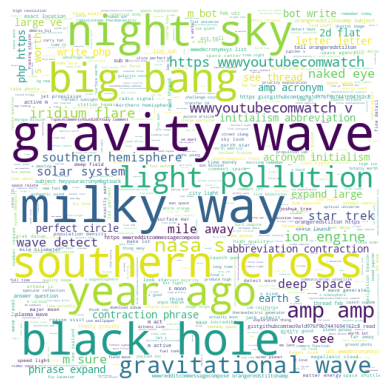

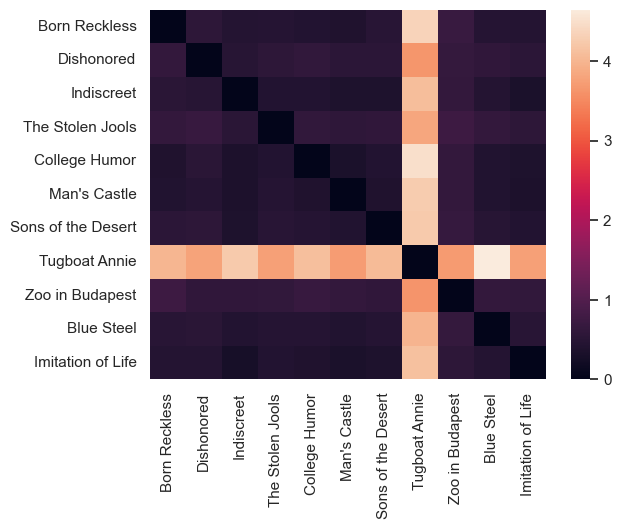

In [215]:
L = []
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference = 'KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()


To reveal more patterns, let's do a multidimensional scaling of the matrix.

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:601: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


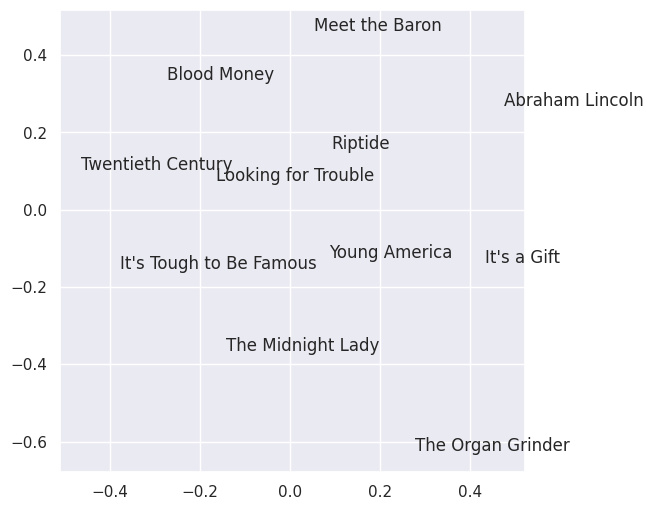

In [ ]:
mds = sklearn.manifold.MDS()
pos = mds.fit(M).embedding_
x = pos[:,0]
y = pos[:,1]
fig, ax = plt.subplots(figsize = (6,6))
plt.plot(x, y, ' ')
for i, txt in enumerate(fileids):
    ax.annotate(txt, (x[i],y[i]))

A co-respondent's course and The Chain Gang are away from the others - any guesses why?

We may just want to focus on the distrbution of stopwords or non-stopwords. Let's do the analysis again first for stopwords and then for non-stopwords.

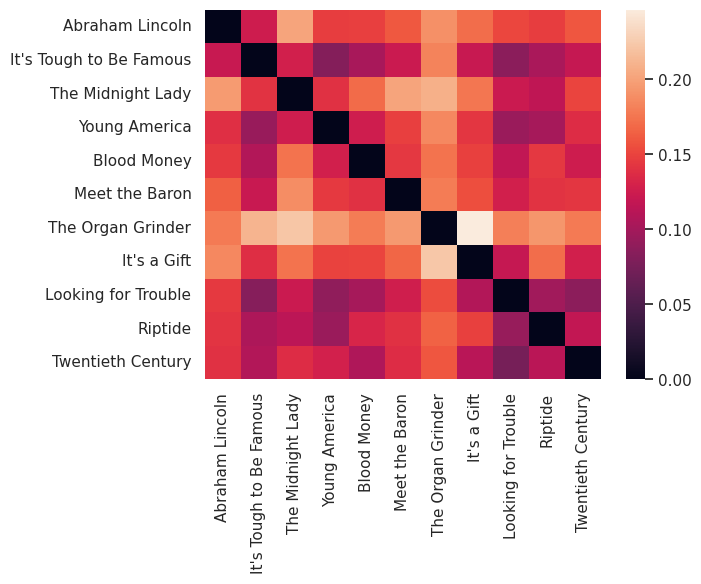

In [ ]:
L = []
for p in corpora_s:
    l = []
    for q in corpora_s:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

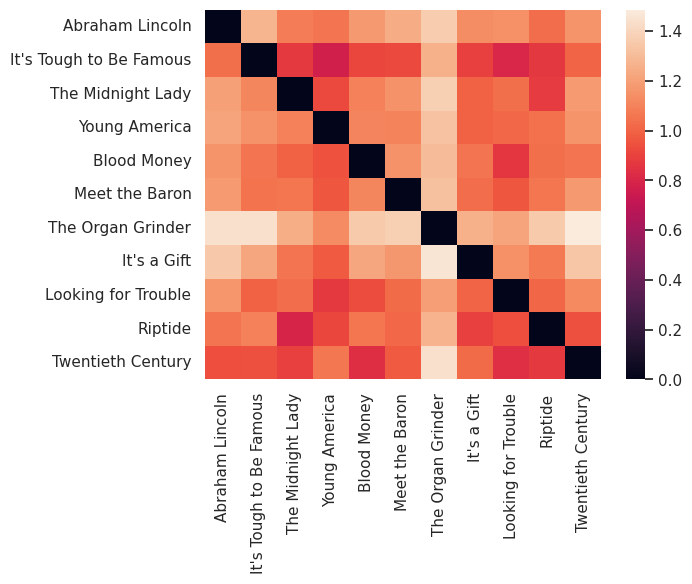

In [ ]:
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

For the KS distance:

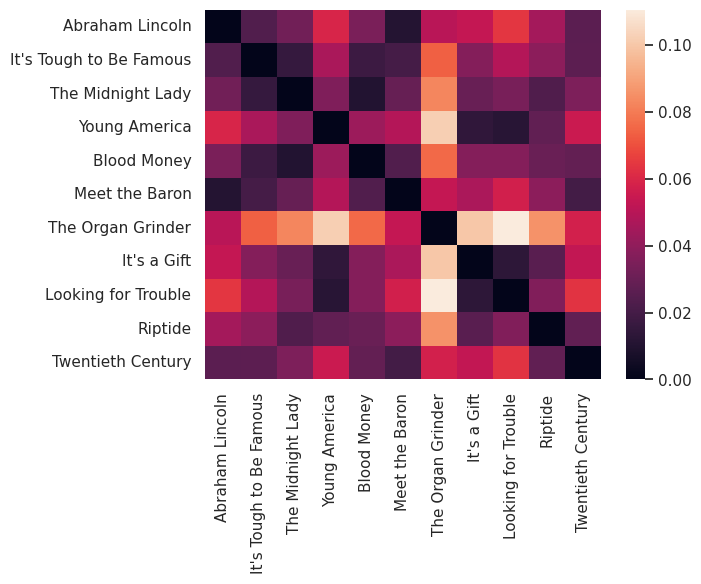

In [ ]:
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

And finally for the Wasserstein or "earth mover's" Distance.

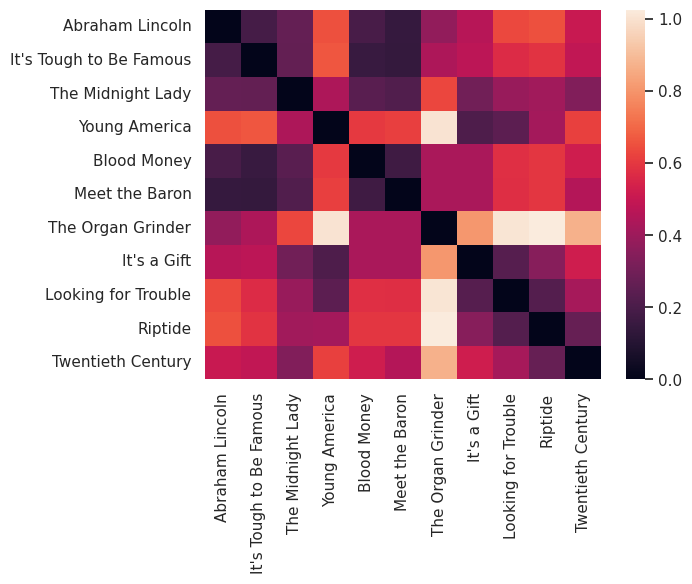

In [ ]:
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='Wasserstein'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

You can see that decade X is highly divergent and this makes reading the plot somewhat difficult. Let's fix this by taking the log of each cell, which will reduce the distance of decode X from other texts as an outlier.

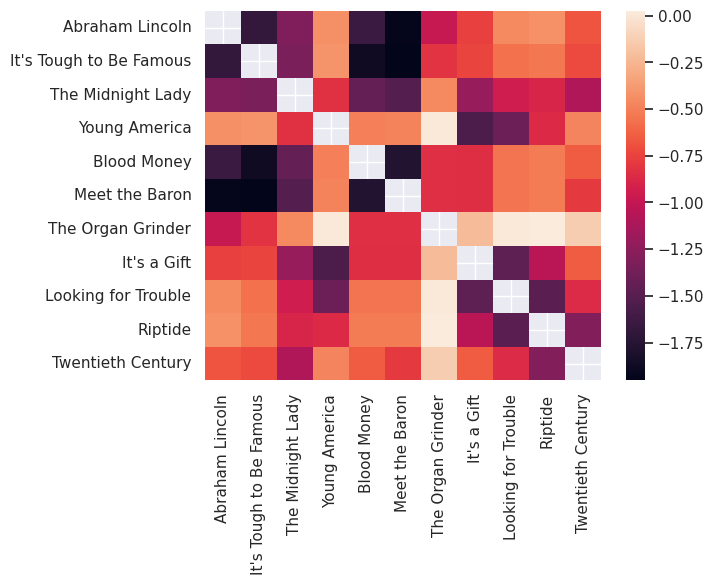

In [ ]:
ax = sns.heatmap(div.apply(np.log).replace([np.inf, -np.inf], np.nan))
plt.show()

We only tried 11 movies, and from the same time period, so our signals might not be too interesting. What about different time periods?

An interesting experiment to maybe get some clearer signals: documents by decade in the Davies Corpus Of Historial American English (COHA) and see if we can detect patterns between them.

If we want to rerun this on a new data set of our own composition, we can be a bit more efficient with our coding. Let's use the Shakespeare texts from last week as example. Here we again make use of our convenient `lucem_illud` functions, namely `loadTextDirectory`, which is found in [loaders.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/loaders.py).

In [ ]:
def loadTextDirectory(targetDir, encoding = 'utf-8'):
    text = []
    fileName = []

    for file in (file for file in os.scandir(targetDir) if file.is_file() and not file.name.startswith('.')):
        with open(file.path, encoding = encoding) as f:
            text.append(f.read())
        fileName.append(file.name)
    return pandas.DataFrame({'text' : text}, index = fileName)

In [ ]:
shakespeare_df = lucem_illud.loadTextDirectory('../data/Shakespeare')

Now we stem and remove stopwords

In [ ]:
shakespeare_df['tokenized_text'] = shakespeare_df['text'].apply(lambda x: word_tokenize(x))
shakespeare_df['normalized_tokens'] = shakespeare_df['tokenized_text'].apply(lambda x: normalizeTokens(x))

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Create the corpus file and generate the heatmap:

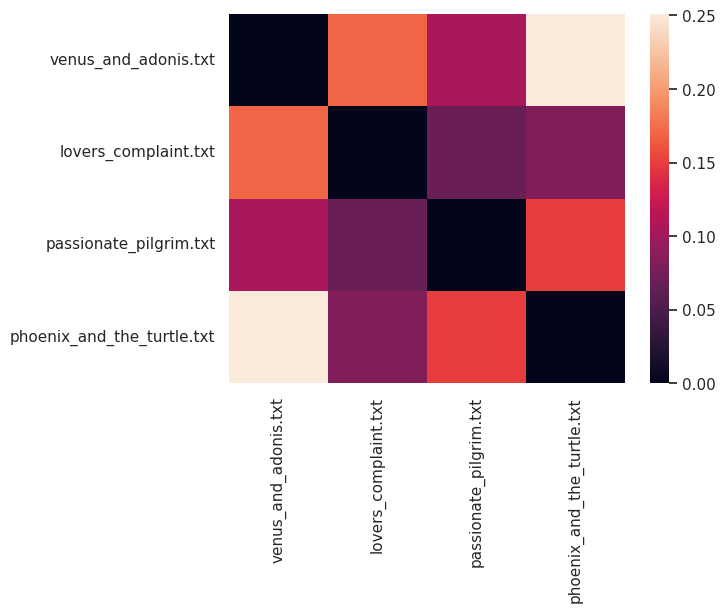

In [ ]:
measure = 'KS' #"KL", "Chi2", "KS", "Wasserstein"
num_of_texts = 10 #The bigger this number the slower it will run, you can also try selecting your own plays
fileids_sp = list(shakespeare_df[:num_of_texts].index)
corpora_sp = list(shakespeare_df[:num_of_texts]['normalized_tokens'])
L = []
for p in corpora_sp:
    l = []
    for q in corpora_sp:
        l.append(Divergence(p,q, difference=measure))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids_sp, index = fileids_sp)
ax = sns.heatmap(div)
plt.show()

What are "The Passionate Pilgrim" and "The Phoenix and the Turtle"? Little known poems by Shakespeare that are unsurprisingly hard to classify, as they are so different from everything else he wrote.

## <font color="red">*Exercise 7*</font>

<font color="red">Construct cells immediately below this that calculate the KL and $\chi^2$ divergences, and the KS and Wasserstein distances between four separate corpora, plot these with heatmaps, and then array them in two dimensions with multidimensional scaling as above. What does this reveal about relations between the corpora? Which analysis (and divergence or distribution) distinguishes the authors or documents better?

**Stretch**: Calculate the [Jensen-Shannon Divergence](https://en.wikipedia.org/wiki/Jensen–Shannon_divergence) between your four corpora. What is the relationship between the KL and JS divergences?</font>

In [ ]:
#  https://github.com/dariusk/corpora/tree/c7017539b853ac9523e79218c20920f786f63a01/data/animals

In [222]:
anReleases = getGithubFiles('https://api.github.com/repos/dariusk/corpora/contents/data/animals', maxFiles = 10)
anReleases[:5]

,name,text,path,html_url,download_url
0,ant_anatomy.json,"{\n ""description"": ""Hymenoptera (ant, bee, was...",data/animals/ant_anatomy.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...
1,birds_antarctica.json,"{\n ""description"": ""Birds of Antarctica, grou...",data/animals/birds_antarctica.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...
2,birds_north_america.json,"{\n ""description"": ""Birds of North America, g...",data/animals/birds_north_america.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...
3,cats.json,"{\r\n ""description"": ""A list of cat breeds"",...",data/animals/cats.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...
4,cephalopod_anatomy.json,"{\n ""description"": ""Cephalopod body parts. Fro...",data/animals/cephalopod_anatomy.json,https://github.com/dariusk/corpora/blob/master...,https://raw.githubusercontent.com/dariusk/corp...


In [235]:
anReleases['tokenized_text'] = anReleases['text'].apply(lambda x: word_tokenize(x))
anReleases['normalized_tokens'] = anReleases['tokenized_text'].apply(lambda x: normalizeTokens(x))

In [257]:
whWords = set(whReleases['normalized_tokens'].sum())
anWords = set(anReleases['normalized_tokens'].sum())

#Change & to | if you want to keep all words
overlapWords = whWords & anWords

overlapWordsDict = {word: index for index, word in enumerate(overlapWords)}
overlapWordsDict['bee']

1401

In [260]:
def makeProbsArray(dfColumn, overlapDict):
    words = dfColumn.sum()
    countList = [0] * len(overlapDict)
    for word in words:
        try:
            countList[overlapDict[word]] += 1
        except KeyError:
            #The word is not common so we skip it
            pass
    countArray = np.array(countList)
    return countArray / countArray.sum()

whProbArray = makeProbsArray(whReleases['normalized_tokens'], overlapWordsDict)
anProbArray = makeProbsArray(anReleases['normalized_tokens'], overlapWordsDict)
anProbArray.sum()
#There is a little bit of a floating point math error
#but it's too small to see with print and too small matter here

1.0

In [262]:
wh_anDivergence = scipy.stats.entropy(whProbArray, anProbArray)
print (wh_anDivergence)
an_whDivergence = scipy.stats.entropy(anProbArray, whProbArray)
print (an_whDivergence)

0.0
0.0


In [264]:
wh_anDivergence_ew = scipy.special.kl_div(whProbArray, anProbArray)
kl_df = pandas.DataFrame(list(overlapWordsDict.keys()), columns = ['word'], index = list(overlapWordsDict.values()))
kl_df = kl_df.sort_index()
kl_df['elementwise divergence'] = wh_anDivergence_ew
kl_df[:10]

,word,elementwise divergence
0,pluto,0.0
1,antetonitrus,0.0
2,miley,0.0
3,dipterous,0.0
4,rhynchosaur,0.0
5,henry,0.0
6,crataeomus,0.0
7,carolina,0.0
8,asiaceratop,0.0
9,paracoxal,0.0


In [265]:
kl_df.sort_values(by='elementwise divergence', ascending=False)[:10]

,word,elementwise divergence
0,pluto,0.0
3215,ontology,0.0
3213,liubangosaurus,0.0
3212,quoc,0.0
3211,lancangjiangosaurus,0.0
3210,cupolo,0.0
3209,wolfie,0.0
3208,elrhazosaurus,0.0
3207,suidian,0.0
3206,barrosasaurus,0.0
